<a href="https://colab.research.google.com/github/Crtljuliette/ggplot2/blob/main/NLP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

NLP Antton inspiré du Notebook du tuteur.

# Requirements

In [ ]:
!pip uninstall spacy -y
!pip install spacy==3.7.2


Found existing installation: spacy 3.7.5
Uninstalling spacy-3.7.5:
  Successfully uninstalled spacy-3.7.5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 64.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 3.6 MB/s eta 0:00:00
  Attempting uninstall: typer
    Found existing installation: typer 0.15.1
    Uninstalling typer-0.15.1:
      Successfully uninstalled typer-0.15.1
  Attempting uninstall: smart-open
    Found existing installation: smart-open 7.1.0
    Uninstalling smart-open-7.1.0:
      Successfully uninstalled smart-open-7.1.0
  Attempting uninstall: cloudpathlib
    Found existing installation: cloudpathlib 0.20.0
    Uninstalling cloudpathlib-0.20.0:
      Successfully uninstalled cloudpathlib-0.20.0
  Attem

In [ ]:
# Téléchargement du modèle anglophone
!python -m spacy download en_core_web_lg
# Pour la réduction de dimension
!pip install umap-learn
# Pour le clusturing
!pip install hdbscan


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 2.9 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 50.1 MB/s eta 0:00:00


# Parsing

In [ ]:
import csv

def read_csv(path: str) -> list[dict]:
    """
    Load a CSV file into a list of dictionaries.

    Args:
        path (str): The file path to the CSV file.

    Returns:
        list[dict]: A list of dictionaries containing the data read from the CSV file.

    Raises:
        FileNotFoundError: If the file does not exist.
        Exception: If there is an error reading the CSV file.
    """
    csv_data = []
    try:
        with open(path, mode='r', encoding='utf-8') as csv_file:
            reader = csv.DictReader(csv_file)
            for row in reader:
                csv_data.append(row)
    except FileNotFoundError:
        print(f"File not found: {path}")
        raise
    except Exception as e:
        print(f"Error reading CSV file: {e}")
        raise
    return csv_data

csv_data = read_csv("/content/dataset_only_english.csv")


In [ ]:
import pandas as pd
from datetime import datetime
import re

def remove_extra_spaces(text: str) -> str:
    """
    Supprime les espaces superflus d'un texte (espaces multiples, début et fin).

    Args:
        text (str): Texte à nettoyer.

    Returns:
        str: Texte nettoyé.
    """
    if pd.isna(text):
        return ""
    cleaned_text = re.sub(r'\s+', ' ', text)
    return cleaned_text.strip()

def process_tweet(tweets_data: list[dict]) -> pd.DataFrame:
    """
    Parse a batch of tweets.

    Args:
        tweets_data (list): List of dictionaries containing tweet data.

    Returns:
        pd.DataFrame: A pandas DataFrame containing parsed tweet data.
    """
    all_records = []

    for tweet in tweets_data:
        note_id = tweet.get("noteId", "")
        author_id = tweet.get("noteAuthorParticipantId", "")
        created_at = int(tweet.get("createdAtMillis", 0)) // 1000
        creation_date = datetime.utcfromtimestamp(created_at).strftime('%Y-%m-%d %H:%M:%S') if created_at > 0 else None
        tweet_id = tweet.get("tweetId", "")
        classification = tweet.get("classification", "")
        trustworthy_sources = tweet.get("trustworthySources", 0)
        summary = remove_extra_spaces(tweet.get("summary", ""))
        is_media_note = tweet.get("isMediaNote", 0)
        url = tweet.get("url", "")
        author_name = remove_extra_spaces(tweet.get("author_name", ""))
        screenname = tweet.get("screenname", "")
        text = remove_extra_spaces(tweet.get("text", ""))
        locked_status = tweet.get("lockedStatus", "")
        language_summary = tweet.get("language_summary", "")
        language_text = tweet.get("language_text", "")

        # Extraire les flags en colonnes individuelles
        misleading_flags = {col: tweet.get(col, 0) for col in tweet.keys() if col.startswith("misleading")}
        not_misleading_flags = {col: tweet.get(col, 0) for col in tweet.keys() if col.startswith("notMisleading")}

        record_data = (
            note_id, author_id, creation_date, tweet_id, classification,
            trustworthy_sources, summary, is_media_note, url, author_name, screenname,
            text, locked_status, language_summary, language_text,
            *misleading_flags.values(), *not_misleading_flags.values()
        )

        all_records.append(record_data)

    # Définir les colonnes
    columns = [
        "noteId", "noteAuthorParticipantId", "creation_date", "tweetId", "classification",
        "trustworthySources", "summary", "isMediaNote", "url", "author_name", "screenname",
        "text", "lockedStatus", "language_summary", "language_text"
    ]

    # Ajouter dynamiquement les colonnes pour les flags
    flag_columns = sorted({col for tweet in tweets_data for col in tweet.keys() if col.startswith("misleading") or col.startswith("notMisleading")})
    columns.extend(flag_columns)

    # Créer le DataFrame
    df = pd.DataFrame.from_records(all_records, columns=columns)

    return df

df = process_tweet(csv_data)
display(df.head())


,noteId,noteAuthorParticipantId,creation_date,tweetId,classification,trustworthySources,summary,isMediaNote,url,author_name,...,misleadingMissingImportantContext,misleadingOther,misleadingOutdatedInformation,misleadingSatire,misleadingUnverifiedClaimAsFact,notMisleadingClearlySatire,notMisleadingFactuallyCorrect,notMisleadingOther,notMisleadingOutdatedButNotWhenWritten,notMisleadingPersonalOpinion
0,1537147343715282945,5684B38EB58FD8BE75ABA37F0BE040EC70380B002ADF9D...,2022-06-15 18:57:40,1537080831751102467,MISINFORMED_OR_POTENTIALLY_MISLEADING,1,Teslas purchased after 12/31/19 are not eligib...,0,https://twitter.com/elonmusk/status/1537080831...,Elon Musk,...,0,0,1,0,0,0,0,0,0,0
1,1817361605237313557,CAA3DEA7CFC07BD080F8BEFA3E6BC1575E6DE1BE2D3BBD...,2024-07-28 00:49:06,1817211899894780374,MISINFORMED_OR_POTENTIALLY_MISLEADING,1,There is no evidence that Ronald Reagan said t...,0,https://twitter.com/Ikennect/status/1817211899...,I am Ken,...,0,0,0,1,1,0,0,0,0,0
2,1594777261995171846,DEB44EE644DD2F0AB97021D46CD7ABE322BF0199CDC38B...,2022-11-21 19:38:23,1594429003569438721,MISINFORMED_OR_POTENTIALLY_MISLEADING,1,SuperFollow subscription pricing can not be ch...,0,https://twitter.com/SaeedDiCaprio/status/15944...,Hurt CoPain,...,1,0,0,1,1,0,0,0,0,0
3,1777467809221746749,4BB4813625461AE3B657AA76389AD6F9C6A9EE05B0C183...,2024-04-08 22:45:24,1777424465892450725,MISINFORMED_OR_POTENTIALLY_MISLEADING,1,This photo both not real and not from the Apri...,0,https://twitter.com/rayasatrung/status/1777424...,Jasim Chatha,...,1,0,1,1,0,0,0,0,0,0
4,1523976585040257028,9B7C8A3AD7A906663202E031B29AEC915EB115C4F39463...,2022-05-10 10:41:46,1523430921659027456,MISINFORMED_OR_POTENTIALLY_MISLEADING,1,There is no reporting supporting this assertio...,0,https://twitter.com/TraveloreReport/status/152...,Travelore Report,...,0,0,0,1,0,0,0,0,0,0


# Importation des données

On importe la base de donnée avec l'ensemble des tweets que l'on va traiter.

In [ ]:
# Importation de la librairie panda
import pandas as pd

# Importation du dataset
dataset = pd.read_csv("//content/dataset_only_english.csv")
# Éviter la troncature des colonnes
pd.set_option('display.max_colwidth', None)  # Affiche tout le contenu des cellules sans les tronquer
# Afficher un échantillon de 10 tweets (text) et de résumés (summary)
print("Exemples de tweets :")
print(dataset['text'].sample(10, random_state=42))

print("\nExemples de Community Notes :")
print(dataset['summary'].sample(10, random_state=42))

Exemples de tweets :
32122                                                                                                                                       🚨🚨🚨 WE ARE ABOUT TO SEE A MASSIVE BREAKOUT ⚠️ ALL BY DESIGN ⚠️ SHARE THIS VIDEO QUICKLY BEFORE THEY TAKE IT DOWN: https://t.co/XmhmZWoQf6— Matt Wallace (@MattWallace888) September 8, 2024\n
1072                                                                                    Keir Starmer was head of DPP between 2008 and 2013.He allowed the prosecution of Sub Postmasters during the Horizon scandal.He needs grilling over it.All credit to PeterExPat for pointing this out.— Goosey (@Goosey30111568) January 6, 2024\n
6757     Bernie Sanders and Pete Buttigieg are rallying Democrats to ABOLISH the unfair Electoral College.A Republican hasn't won the popular vote in nearly 20 YEARS, but the Electoral College is RIGGED in their favor…If 2/3 of states want to abolish the Electoral College, it’s GONE.— Scott 🇺🇸🌊💙 (@smaloney924) August 

<ipython-input-6-55af9d6c2769>:5: DtypeWarning: Columns (5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  dataset = pd.read_csv("//content/dataset_only_english.csv")


#Nettoyage des 'text' et 'summary'

nettoyage de dates, url, emoji, les num qu'il y avait au début, les noms avec @ aussi( j'ai vu qu'il en reste pour certains qui ne fonctionnent pas comme tout le monde)

In [ ]:
import pandas as pd
import re
from tabulate import tabulate
from IPython.display import display, Markdown


# Fonction pour supprimer les emojis avec regex
def remove_emojis(text):
    emoji_pattern = re.compile(
        "[\U0001F600-\U0001F64F"  # Emoticons
        "\U0001F300-\U0001F5FF"  # Symboles & pictogrammes
        "\U0001F680-\U0001F6FF"  # Transport & cartes
        "\U0001F700-\U0001F77F"  # Alchimie
        "\U0001F780-\U0001F7FF"  # Géométrie supplémentaire
        "\U0001F800-\U0001F8FF"  # Suppléments divers
        "\U0001F900-\U0001F9FF"  # Suppléments supplémentaires
        "\U0001FA00-\U0001FA6F"  # Objets divers
        "\U0001FA70-\U0001FAFF"  # Objets supplémentaires
        "\U00002702-\U000027B0"  # Divers symboles
        "\U000024C2-\U0001F251"  # Symboles Enclosed
        "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

def clean_text(text):
    # Supprime les URLsm
    text = re.sub(r'https?://\S+', '', text)
    # Supprime les dates
    text = re.sub(r'\b(January|February|March|April|May|June|July|August|September|October|November|December) \d{1,2}, \d{4}\b', '', text)
    # Supprimer les numéros au début
    text = re.sub(r'^\d+\s*', '', text)

    # Supprimer les emojis
    text = remove_emojis(text)

    # Supprimer tout après "—"
    text = re.sub(r'—.*$', '', text)
    return text.strip()

dataset['text'] = dataset['text'].apply(lambda x: clean_text(x))
dataset['summary'] = dataset['summary'].apply(lambda x: clean_text(x))

# Voir dataset en beau dataframe
df.head()

#Pour mieux voir les texts et summary
pd.set_option('display.max_colwidth', None)
print("Exemples de tweets :")
print(dataset['text'].sample(10, random_state=42))

print("\nExemples de Community Notes :")
print(dataset['summary'].sample(10, random_state=42))

Exemples de tweets :
32122                                                                                                                                              WE ARE ABOUT TO SEE A MASSIVE BREAKOUT  ALL BY DESIGN  SHARE THIS VIDEO QUICKLY BEFORE THEY TAKE IT DOWN:  Matt Wallace (@MattWallace888)
1072                                                                                   Keir Starmer was head of DPP between 2008 and 2013.He allowed the prosecution of Sub Postmasters during the Horizon scandal.He needs grilling over it.All credit to PeterExPat for pointing this out.
6757     Bernie Sanders and Pete Buttigieg are rallying Democrats to ABOLISH the unfair Electoral College.A Republican hasn't won the popular vote in nearly 20 YEARS, but the Electoral College is RIGGED in their favor…If 2/3 of states want to abolish the Electoral College, it’s GONE.
32091                                                                                                                       

# NLP via Spacy

Spacy est une librairie NLP qui propose des modèles pré-entrainés en français, anglais, etc.

Le principe général consiste à envoyer un texte à Spacy, qui va appliquer différentes fonctions linguistiques et nous retourner un objet "Doc" annoté.

Parmi ces fonctions linguistiques les plus couramment utilisées sont

    tokenization : consiste à découper le texte en "mots"
    Part of Speech (PoS) tagging : consiste à identifier le type de mot (nom, verbe, adjectif...)
    lemmatization : transforme le mot dans sa forme canonique. Un nom sera remis au singulier, masculin. Un verbe, à l'infinitif.
    Name Entity Recognition (NER) : détecte une entité nommée, telle qu'une localisation, une personne, une organisation


Premier test NLP avec création d'un nuage de mots, code appuyer par chatgpt et le topic modeling d'Erwan.
Fonctionne mais j'ai pas eu le temps de tout comprendre et de jouer sur des param, mais je peux plus là


NLP Process: 100%|██████████| 38705/38705 [01:55<00:00, 335.84it/s]


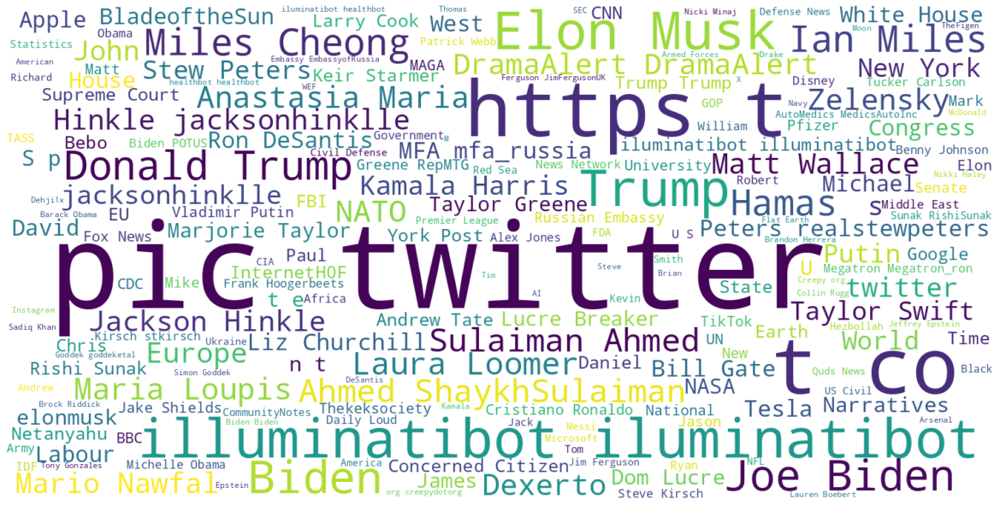

In [ ]:
import spacy
import torch
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from tqdm import tqdm

def load_spacy_model(model: str) -> spacy.language.Language:
    if torch.cuda.is_available():
        spacy.prefer_gpu()
    return spacy.load(model)

def spacy_NER(nlp, df: pd.DataFrame, col_text: str, entities_to_keep=None, batch_size: int = 100, n_process: int = 1) -> pd.DataFrame:
    if entities_to_keep is None:
        entities_to_keep = ['PERSON', 'ORG', 'LOC']

    l_text = df[col_text].dropna().tolist()  # Éviter les NaN
    all_records = []

    for doc in tqdm(nlp.pipe(l_text, batch_size=batch_size, n_process=n_process), total=len(l_text), desc="NLP Process"):
        NER_text = [ent.text for ent in doc.ents if ent.label_ in entities_to_keep]
        all_records.append(NER_text)

    df = df.dropna(subset=[col_text]).copy()  # Supprimer aussi les lignes vides
    df["NER_text"] = all_records
    df = df.explode("NER_text").dropna(subset=["NER_text"])  # Une ligne par entité nommée
    return df

def generate_wordcloud(text_series: pd.Series, width=1500, height=750, dpi=72, background_color='white'):
    text = " ".join(text_series.dropna().astype(str))  # Concaténer tous les mots
    wordcloud = WordCloud(width=width, height=height, background_color=background_color, prefer_horizontal=1).generate(text)

    plt.figure(figsize=(width/dpi, height/dpi), dpi=dpi)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Charger le modèle SpaCy
nlp = load_spacy_model("en_core_web_lg")

# Appliquer la reconnaissance d'entités nommées sur la colonne "text"
df = spacy_NER(nlp, df, "text", entities_to_keep=["PERSON", "ORG", "LOC"])

# Générer le nuage de mots à partir des entités reconnues
generate_wordcloud(df["NER_text"])


# Délire de Juju

Nous donner les labels de ? à voir mais j'ai plus la fois là

In [ ]:
import spacy
import torch
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from tqdm import tqdm

def load_spacy_model(model: str) -> spacy.language.Language:
    """
    Load a spaCy model with optional configurations.

    Args:
        model: str
          Name of the spaCy model to load

    Returns:
        nlp: spacy.language.Language
          Loaded spaCy language processing pipeline
    """
    if torch.cuda.is_available():
        spacy.prefer_gpu()

    nlp = spacy.load(model)
    return nlp

def spacy_NER(nlp, df: pd.DataFrame, col_text: str, entities_to_keep=None, explode: bool = True, batch_size: int = 100, n_process: int = 1) -> pd.DataFrame:
    """
    Spacy implementation of NER.

    Args:
        nlp : spacy.language.Language
            The spaCy language processing pipeline.
        df : pd.DataFrame
            DataFrame containing the text data.
        col_text : str
            The name of the column containing the text data.
        entities_to_keep : list, optional
            List of entity types to keep. Default is ['PERSON','ORG', 'LOC'].
        batch_size : int, optional
            Batch sizes
        n_process : int, optional
            Number of processes

    Returns:
        pd.DataFrame
          DataFrame containing the NER information.
    """
    if entities_to_keep is None:
        entities_to_keep = ['PERSON', 'ORG', 'LOC']

    l_text = df[col_text].tolist()
    all_records = []

    for doc in tqdm(nlp.pipe(l_text, batch_size=batch_size, n_process=n_process), total=len(l_text), desc="NLP Process"):
        NER_type = []
        NER_text = []
        NER_start_char = []
        NER_end_char = []

        for ent in doc.ents:
            if ent.label_ in entities_to_keep:
                NER_type.append(ent.label_)
                NER_text.append(ent.text)
                NER_start_char.append(ent.start_char)
                NER_end_char.append(ent.end_char)

        record = (NER_type, NER_text, NER_start_char, NER_end_char)
        all_records.append(record)

    df['NER_type'], df['NER_text'], df['NER_start_char'], df['NER_end_char'] = zip(*all_records)
    return df

def generate_wordcloud(df: pd.DataFrame,
                       col_word: str,
                       col_metric: str,
                       width: int = 1500,
                       height: int = 750,
                       dpi: int = 72,
                       background_color: str = 'white',
                       show: bool = False) -> WordCloud:
    """
    Generate a word cloud from a DataFrame.

    Args:
      df (pd.DataFrame): DataFrame containing word frequency data.
      col_word (str): Column name containing words.
      col_metric (str): Column name containing frequency metrics for each word.
      width (int, optional): Width of the word cloud image. Defaults to 1500.
      height (int, optional): Height of the word cloud image. Defaults to 750.
      dpi (int, optional): Dots per inch for image resolution. Defaults to 72.
      background_color (str, optional): Background color of the word cloud image. Defaults to 'white'.
      show (bool, optional): Whether to display the word cloud image. Defaults to False.

    Returns:
      WordCloud: WordCloud object representing the generated word cloud.
    """
    top_n_words = {row[col_word]: row[col_metric] for _, row in df.iterrows()}

    wordcloud = WordCloud(width=width, height=height, background_color=background_color, prefer_horizontal=1).generate_from_frequencies(top_n_words)

    if show:
        plt.figure(figsize=(width/dpi, height/dpi), dpi=dpi)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.show()

    return wordcloud

# Vérification des labels du modèle NER
pipe_details = nlp.get_pipe("ner")
labels = list(pipe_details.labels)
print(labels)



['CARDINAL', 'DATE', 'EVENT', 'FAC', 'GPE', 'LANGUAGE', 'LAW', 'LOC', 'MONEY', 'NORP', 'ORDINAL', 'ORG', 'PERCENT', 'PERSON', 'PRODUCT', 'QUANTITY', 'TIME', 'WORK_OF_ART']


Essai nuage de mots

In [ ]:
import spacy
import torch
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from tqdm import tqdm

def load_spacy_model(model: str) -> spacy.language.Language:
    """
    Load a spaCy model with optional configurations.

    Args:
        model: str
          Name of the spaCy model to load

    Returns:
        nlp: spacy.language.Language
          Loaded spaCy language processing pipeline
    """
    if torch.cuda.is_available():
        spacy.prefer_gpu()

    nlp = spacy.load(model)
    return nlp

def spacy_NER(nlp, df: pd.DataFrame, col_text: str, entities_to_keep=None, explode: bool = True, batch_size: int = 100, n_process: int = 1) -> pd.DataFrame:
    """
    Spacy implementation of NER.

    Args:
        nlp : spacy.language.Language
            The spaCy language processing pipeline.
        df : pd.DataFrame
            DataFrame containing the text data.
        col_text : str
            The name of the column containing the text data.
        entities_to_keep : list, optional
            List of entity types to keep. Default is ['PERSON','ORG', 'LOC'].
        batch_size : int, optional
            Batch sizes
        n_process : int, optional
            Number of processes

    Returns:
        pd.DataFrame
          DataFrame containing the NER information.
    """
    if entities_to_keep is None:
        entities_to_keep =['CARDINAL', 'DATE', 'EVENT', 'FAC', 'GPE', 'LANGUAGE', 'LAW', 'LOC', 'MONEY', 'NORP', 'ORDINAL', 'ORG', 'PERCENT', 'PERSON', 'PRODUCT', 'QUANTITY', 'TIME', 'WORK_OF_ART']

    l_text = df[col_text].tolist()
    all_records = []

    for doc in tqdm(nlp.pipe(l_text, batch_size=batch_size, n_process=n_process), total=len(l_text), desc="NLP Process"):
        NER_type = []
        NER_text = []
        NER_start_char = []
        NER_end_char = []

        for ent in doc.ents:
            if ent.label_ in entities_to_keep:
                NER_type.append(ent.label_)
                NER_text.append(ent.text)
                NER_start_char.append(ent.start_char)
                NER_end_char.append(ent.end_char)

        record = (NER_type, NER_text, NER_start_char, NER_end_char)
        all_records.append(record)

    df['NER_type'], df['NER_text'], df['NER_start_char'], df['NER_end_char'] = zip(*all_records)
    return df

def generate_wordcloud(df: pd.DataFrame,
                       col_word: str,
                       col_metric: str,
                       width: int = 1500,
                       height: int = 750,
                       dpi: int = 72,
                       background_color: str = 'white',
                       show: bool = False) -> WordCloud:
    """
    Generate a word cloud from a DataFrame.

    Args:
      df (pd.DataFrame): DataFrame containing word frequency data.
      col_word (str): Column name containing words.
      col_metric (str): Column name containing frequency metrics for each word.
      width (int, optional): Width of the word cloud image. Defaults to 1500.
      height (int, optional): Height of the word cloud image. Defaults to 750.
      dpi (int, optional): Dots per inch for image resolution. Defaults to 72.
      background_color (str, optional): Background color of the word cloud image. Defaults to 'white'.
      show (bool, optional): Whether to display the word cloud image. Defaults to False.

    Returns:
      WordCloud: WordCloud object representing the generated word cloud.
    """
    top_n_words = {row[col_word]: row[col_metric] for _, row in df.iterrows()}

    wordcloud = WordCloud(width=width, height=height, background_color=background_color, prefer_horizontal=1).generate_from_frequencies(top_n_words)

    if show:
        plt.figure(figsize=(width/dpi, height/dpi), dpi=dpi)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.show()

    return wordcloud


# Chargement du modèle spaCy
nlp = load_spacy_model("en_core_web_lg")

# Ici on sélectionne le type d'entités nommées à détecter
entity_labels = ['CARDINAL', 'DATE', 'EVENT', 'FAC', 'GPE', 'LANGUAGE', 'LAW', 'LOC', 'MONEY', 'NORP', 'ORDINAL', 'ORG', 'PERCENT', 'PERSON', 'PRODUCT', 'QUANTITY', 'TIME', 'WORK_OF_ART']

# on utilise la fonction de détection d'entitées nommées
df = spacy_NER(nlp, df, "text", entities_to_keep = entity_labels, batch_size = 100, n_process = 1)

# on crée un nouveau dataframe où 1 ligne = 1 entitée
df_entities = df.copy()
df_entities = df_entities[df_entities['NER_type'].apply(lambda x: len(x) > 0)]
df_entities = df_entities.explode(['NER_type', 'NER_text'])

# on affiche les entitées les plus fréquemment citées
for NER_type in entity_labels:
  df_top_entities = (
                      df_entities[df_entities['NER_type']== NER_type].groupby(['NER_text', 'NER_type'])
                      .agg({"tweetId":'nunique', 'text':'sum'})
                      .sort_values(by="tweetId", ascending=False)
                      .reset_index()
                    )
  generate_wordcloud(df_top_entities.head(50), "NER_text", "text", show = True)
  print('\n'*3)
"""
# Vérification des labels du modèle NER
pipe_details = nlp.get_pipe("ner")
labels = list(pipe_details.labels)
print(labels)

# Affichage des premières lignes du DataFrame
df.head()"""


NLP Process: 100%|██████████| 75758/75758 [07:40<00:00, 164.34it/s]


ValueError: could not convert string to float: '🚨BREAKING — The White House physician just provided an update on Joe’s sniffles, revealing they administered a staggering 10 (!!!) doses of Paxlovid. Looks like they’re really trying to get rid of him for good. pic.twitter.com/0A2GIroRxN— Dr. Simon Goddek (@goddeketal)🚨BREAKING — The White House physician just provided an update on Joe’s sniffles, revealing they administered a staggering 10 (!!!) doses of Paxlovid. Looks like they’re really trying to get rid of him for good. pic.twitter.com/0A2GIroRxN— Dr. Simon Goddek (@goddeketal)🚨BREAKING — The White House physician just provided an update on Joe’s sniffles, revealing they administered a staggering 10 (!!!) doses of Paxlovid. Looks like they’re really trying to get rid of him for good. pic.twitter.com/0A2GIroRxN— Dr. Simon Goddek (@goddeketal)With the other hostages Hamas has also released 10 Thai  men and 1 Filipino. Strange that nobody mentioned them before. But all human life is valuable #HostageRelease pic.twitter.com/VimDVLjtaw— Diane Abbott (@HackneyAbbott)With the other hostages Hamas has also released 10 Thai  men and 1 Filipino. Strange that nobody mentioned them before. But all human life is valuable #HostageRelease pic.twitter.com/VimDVLjtaw— Diane Abbott (@HackneyAbbott)With the other hostages Hamas has also released 10 Thai  men and 1 Filipino. Strange that nobody mentioned them before. But all human life is valuable #HostageRelease pic.twitter.com/VimDVLjtaw— Diane Abbott (@HackneyAbbott)With the other hostages Hamas has also released 10 Thai  men and 1 Filipino. Strange that nobody mentioned them before. But all human life is valuable #HostageRelease pic.twitter.com/VimDVLjtaw— Diane Abbott (@HackneyAbbott)Number of Ex-President & Prime Minister imprisoned since 1900:🇮🇹 Italy: 10🇵🇰 Pakistan: 8🇰🇷 South Korea: 7 🇭🇺 Hungary: 6🇧🇷 Brazil: 5🇲🇷 Mauritania: 5 🇲🇱 Mali: 5🇦🇷 Argentina: 5🇧🇩 Bangladesh: 5🇮🇶 Iraq: 5🇯🇵 Japan: 5🇻🇪 Venezuela: 5🇩🇿 Algeria: 4🇧🇬 Bulgaria: 4🇺🇦Ukraine: 4…— World of Statistics (@stats_feed)Number of Ex-President & Prime Minister imprisoned since 1900:🇮🇹 Italy: 10🇵🇰 Pakistan: 8🇰🇷 South Korea: 7 🇭🇺 Hungary: 6🇧🇷 Brazil: 5🇲🇷 Mauritania: 5 🇲🇱 Mali: 5🇦🇷 Argentina: 5🇧🇩 Bangladesh: 5🇮🇶 Iraq: 5🇯🇵 Japan: 5🇻🇪 Venezuela: 5🇩🇿 Algeria: 4🇧🇬 Bulgaria: 4🇺🇦Ukraine: 4…— World of Statistics (@stats_feed)Philadelphia just opened 10 “satellite election offices.”  Gang, these are effectively 10, unsupervised ballot running/harvesting operations staffed by Democrats and funded by taxpayers a full seven months before the election.  All under the auspices of “easy access” in a state…— Chris Stigall (@ChrisStigall)Philadelphia just opened 10 “satellite election offices.”  Gang, these are effectively 10, unsupervised ballot running/harvesting operations staffed by Democrats and funded by taxpayers a full seven months before the election.  All under the auspices of “easy access” in a state…— Chris Stigall (@ChrisStigall)Sweden confirmed the loss of ALL by Leopard 2A5 tanks of the #Swedish modification Strv 122, which were delivered to #Ukraine.Their losses amounted to 10 out of 10 such tanks delivered . pic.twitter.com/plOBIVqUdY— Arthur Morgan (@ArthurM40330824)Sweden confirmed the loss of ALL by Leopard 2A5 tanks of the #Swedish modification Strv 122, which were delivered to #Ukraine.Their losses amounted to 10 out of 10 such tanks delivered . pic.twitter.com/plOBIVqUdY— Arthur Morgan (@ArthurM40330824)Sweden confirmed the loss of ALL by Leopard 2A5 tanks of the #Swedish modification Strv 122, which were delivered to #Ukraine.Their losses amounted to 10 out of 10 such tanks delivered . pic.twitter.com/plOBIVqUdY— Arthur Morgan (@ArthurM40330824)Sweden confirmed the loss of ALL by Leopard 2A5 tanks of the #Swedish modification Strv 122, which were delivered to #Ukraine.Their losses amounted to 10 out of 10 such tanks delivered . pic.twitter.com/plOBIVqUdY— Arthur Morgan (@ArthurM40330824)The CDC has been lying to people for over 20 years in denying the link between vaccines and autism. In just 40 minutes after launching my survey, I now have a highly statistically significant result. If you are unvaccinated vs. 10 or more vaccines, you have a 6X lower chance of… pic.twitter.com/hykAPLmF0n— Steve Kirsch (@stkirsch)The CDC has been lying to people for over 20 years in denying the link between vaccines and autism. In just 40 minutes after launching my survey, I now have a highly statistically significant result. If you are unvaccinated vs. 10 or more vaccines, you have a 6X lower chance of… pic.twitter.com/hykAPLmF0n— Steve Kirsch (@stkirsch)The CDC has been lying to people for over 20 years in denying the link between vaccines and autism. In just 40 minutes after launching my survey, I now have a highly statistically significant result. If you are unvaccinated vs. 10 or more vaccines, you have a 6X lower chance of… pic.twitter.com/hykAPLmF0n— Steve Kirsch (@stkirsch)Your IQ Is 140 If You Can Name 10 Of These People— BUZZNET (@BUZZNET)🚨LATEST UPDATE ON AIRSTRIKES AGAINST THE HOUTHIS BY U.S AND U.K WARPLANES:Cities in Yemen Hit with US and UK Airstrikes: Sana\'a, Hodeidah, Saada, Dhamar, Taiz, Zabid.Pentagon: We bombed 10 targets in YemenPentagon : UAV production facilities and IMD warehouses were…  pic.twitter.com/L57W03hqbp— Mario Nawfal (@MarioNawfal)🚨LATEST UPDATE ON AIRSTRIKES AGAINST THE HOUTHIS BY U.S AND U.K WARPLANES:Cities in Yemen Hit with US and UK Airstrikes: Sana\'a, Hodeidah, Saada, Dhamar, Taiz, Zabid.Pentagon: We bombed 10 targets in YemenPentagon : UAV production facilities and IMD warehouses were…  pic.twitter.com/L57W03hqbp— Mario Nawfal (@MarioNawfal)🚨LATEST UPDATE ON AIRSTRIKES AGAINST THE HOUTHIS BY U.S AND U.K WARPLANES:Cities in Yemen Hit with US and UK Airstrikes: Sana\'a, Hodeidah, Saada, Dhamar, Taiz, Zabid.Pentagon: We bombed 10 targets in YemenPentagon : UAV production facilities and IMD warehouses were…  pic.twitter.com/L57W03hqbp— Mario Nawfal (@MarioNawfal)🚨LATEST UPDATE ON AIRSTRIKES AGAINST THE HOUTHIS BY U.S AND U.K WARPLANES:Cities in Yemen Hit with US and UK Airstrikes: Sana\'a, Hodeidah, Saada, Dhamar, Taiz, Zabid.Pentagon: We bombed 10 targets in YemenPentagon : UAV production facilities and IMD warehouses were…  pic.twitter.com/L57W03hqbp— Mario Nawfal (@MarioNawfal)🚨LATEST UPDATE ON AIRSTRIKES AGAINST THE HOUTHIS BY U.S AND U.K WARPLANES:Cities in Yemen Hit with US and UK Airstrikes: Sana\'a, Hodeidah, Saada, Dhamar, Taiz, Zabid.Pentagon: We bombed 10 targets in YemenPentagon : UAV production facilities and IMD warehouses were…  pic.twitter.com/L57W03hqbp— Mario Nawfal (@MarioNawfal)🚨LATEST UPDATE ON AIRSTRIKES AGAINST THE HOUTHIS BY U.S AND U.K WARPLANES:Cities in Yemen Hit with US and UK Airstrikes: Sana\'a, Hodeidah, Saada, Dhamar, Taiz, Zabid.Pentagon: We bombed 10 targets in YemenPentagon : UAV production facilities and IMD warehouses were…  pic.twitter.com/L57W03hqbp— Mario Nawfal (@MarioNawfal)🚨LATEST UPDATE ON AIRSTRIKES AGAINST THE HOUTHIS BY U.S AND U.K WARPLANES:Cities in Yemen Hit with US and UK Airstrikes: Sana\'a, Hodeidah, Saada, Dhamar, Taiz, Zabid.Pentagon: We bombed 10 targets in YemenPentagon : UAV production facilities and IMD warehouses were…  pic.twitter.com/L57W03hqbp— Mario Nawfal (@MarioNawfal)10 of the Most In-Demand Jobs in Australia— Eamon Shannon (@ShannonEam28903)🔥🚨BREAKING: Amiri King discovered that Brian Krassenstein is one of the top 10 accounts on X that PROVIDES community notes. pic.twitter.com/YCsRCoBpbU— Dom Lucre | Breaker of Narratives (@dom_lucre)🔥🚨BREAKING: Amiri King discovered that Brian Krassenstein is one of the top 10 accounts on X that PROVIDES community notes. pic.twitter.com/YCsRCoBpbU— Dom Lucre | Breaker of Narratives (@dom_lucre)🔥🚨BREAKING: Amiri King discovered that Brian Krassenstein is one of the top 10 accounts on X that PROVIDES community notes. pic.twitter.com/YCsRCoBpbU— Dom Lucre | Breaker of Narratives (@dom_lucre)🔥🚨BREAKING: Amiri King discovered that Brian Krassenstein is one of the top 10 accounts on X that PROVIDES community notes. pic.twitter.com/YCsRCoBpbU— Dom Lucre | Breaker of Narratives (@dom_lucre)Italy announces: the terrorist organization Hamas has kidnapped 10 Italian residents, including a one-year-old baby.— Hananya Naftali (@HananyaNaftali)Italy announces: the terrorist organization Hamas has kidnapped 10 Italian residents, including a one-year-old baby.— Hananya Naftali (@HananyaNaftali)honestly so sick of these limits wth am i supposed to do with 10 messages pic.twitter.com/UBSsWJFYHv— not a sloth (@testaccountoki)It’s why we made sure that Climate Action Incentive payments give more money back to 8 out of 10 Canadian families.— Chrystia Freeland (@cafreeland)Russia began to use Terminators in the SMO 9 months ago. For the entire time of combat, only one vehicle was lost. Russia produces 10 such vehicles per month. It\'s reported that the production schedule is changing, now 18 such military machines will leave the workshops per month. pic.twitter.com/vxLmsgoPJK— Trollstoy (@Trollstoy88)Kobe and MJ never lost 10 straight to the same team pic.twitter.com/lmChRvVNFE— booker (@bookorme)Kobe and MJ never lost 10 straight to the same team pic.twitter.com/lmChRvVNFE— booker (@bookorme)This is the most amazing country anyone on earth can be.Literally, the poorest person in this country is a BillionaireEverywhere you turn, 5 out 10 persons is a BillionaireThis country is the single Billionaire location in the world… pic.twitter.com/P9V9Ca9QAj— Dr. Bright Sekoni (@BrightSekoni_)This is the most amazing country anyone on earth can be.Literally, the poorest person in this country is a BillionaireEverywhere you turn, 5 out 10 persons is a BillionaireThis country is the single Billionaire location in the world… pic.twitter.com/P9V9Ca9QAj— Dr. Bright Sekoni (@BrightSekoni_)This is the most amazing country anyone on earth can be.Literally, the poorest person in this country is a BillionaireEverywhere you turn, 5 out 10 persons is a BillionaireThis country is the single Billionaire location in the world… pic.twitter.com/P9V9Ca9QAj— Dr. Bright Sekoni (@BrightSekoni_)MIT just made its classes available online for free.Payment is not necessary.The following 10 classes are must-takes in 2024: pic.twitter.com/TcuOfk8ktn— Bishal Nandi (@LearnWithBishal)Forget ChatGPT, It costs $20/Mo to use.Instead, use Merlin, you\'ll never need ChatGPT.Here are 10 reasons Merlin will make you 10x more productive.[ THREAD ] 🧵— Alamin (@iam_chonchol)Forget ChatGPT, It costs $20/Mo to use.Instead, use Merlin, you\'ll never need ChatGPT.Here are 10 reasons Merlin will make you 10x more productive.[ THREAD ] 🧵— Alamin (@iam_chonchol)Forget ChatGPT, It costs $20/Mo to use.Instead, use Merlin, you\'ll never need ChatGPT.Here are 10 reasons Merlin will make you 10x more productive.[ THREAD ] 🧵— Alamin (@iam_chonchol)Forget ChatGPT, It costs $20/Mo to use.Instead, use Merlin, you\'ll never need ChatGPT.Here are 10 reasons Merlin will make you 10x more productive.[ THREAD ] 🧵— Alamin (@iam_chonchol)Forget ChatGPT, It costs $20/Mo to use.Instead, use Merlin, you\'ll never need ChatGPT.Here are 10 reasons Merlin will make you 10x more productive.[ THREAD ] 🧵— Alamin (@iam_chonchol)The top 10 worst investment mistakes since 1876.1. Ronald Wayne sells 10% of Apple for $800 (now worth $300 billion) pic.twitter.com/CtTr0aUy0q— Neal Taparia (@nealtaparia)The top 10 worst investment mistakes since 1876.1. Ronald Wayne sells 10% of Apple for $800 (now worth $300 billion) pic.twitter.com/CtTr0aUy0q— Neal Taparia (@nealtaparia)The top 10 worst investment mistakes since 1876.1. Ronald Wayne sells 10% of Apple for $800 (now worth $300 billion) pic.twitter.com/CtTr0aUy0q— Neal Taparia (@nealtaparia)The top 10 worst investment mistakes since 1876.1. Ronald Wayne sells 10% of Apple for $800 (now worth $300 billion) pic.twitter.com/CtTr0aUy0q— Neal Taparia (@nealtaparia)It’s been less than 3 days since OpenAI released its latest model GPT-4oAnd people are doing crazy things with it.Here are 10 incredible use cases so far: pic.twitter.com/DLzhOIAhRk— Tulsi Soni (@shedntcare_)It’s been less than 3 days since OpenAI released its latest model GPT-4oAnd people are doing crazy things with it.Here are 10 incredible use cases so far: pic.twitter.com/DLzhOIAhRk— Tulsi Soni (@shedntcare_)It’s been less than 3 days since OpenAI released its latest model GPT-4oAnd people are doing crazy things with it.Here are 10 incredible use cases so far: pic.twitter.com/DLzhOIAhRk— Tulsi Soni (@shedntcare_)With the other hostages Hamas has also released 10 Thai  men and 1 Filipino. Strange that nobody mentioned them before. But all human life is valuable #HostageRelease pic.twitter.com/VimDVLjtaw— Diane Abbott (@HackneyAbbott)With the other hostages Hamas has also released 10 Thai  men and 1 Filipino. Strange that nobody mentioned them before. But all human life is valuable #HostageRelease pic.twitter.com/VimDVLjtaw— Diane Abbott (@HackneyAbbott)With the other hostages Hamas has also released 10 Thai  men and 1 Filipino. Strange that nobody mentioned them before. But all human life is valuable #HostageRelease pic.twitter.com/VimDVLjtaw— Diane Abbott (@HackneyAbbott)With the other hostages Hamas has also released 10 Thai  men and 1 Filipino. Strange that nobody mentioned them before. But all human life is valuable #HostageRelease pic.twitter.com/VimDVLjtaw— Diane Abbott (@HackneyAbbott)MIT University is offering free online courses.No textbooks or fees required.Here are 10 courses you don\'t want to miss & start earning $2000/m pic.twitter.com/AvTosqhdXn— Tulsi Soni (@shedntcare_)MIT University is offering free online courses.No textbooks or fees required.Here are 10 courses you don\'t want to miss & start earning $2000/m pic.twitter.com/AvTosqhdXn— Tulsi Soni (@shedntcare_)Your IQ Is 140 If You Can Name 10 Of These People— BUZZNET (@BUZZNET)This is Joe Dispenza.A world-renowned neuroscientist.He teaches people how to brainwash themselves into thinking on a higher level.Some say he\'s a fraud & supernatural.Here are 10 of his insights that shifted the trajectory of my life (and will do the same for you): pic.twitter.com/jfagt6qIPO— Tim Denning (@Tim_Denning)This is Joe Dispenza.A world-renowned neuroscientist.He teaches people how to brainwash themselves into thinking on a higher level.Some say he\'s a fraud & supernatural.Here are 10 of his insights that shifted the trajectory of my life (and will do the same for you): pic.twitter.com/jfagt6qIPO— Tim Denning (@Tim_Denning)Kevin De Bruyne is just 10 [TEN] assists away from becoming the midfielder with the most Premier League assists in history. He currently has 102 PL assists pic.twitter.com/h8aYfTJa1r— BH (@MCFC___BH)Kevin De Bruyne is just 10 [TEN] assists away from becoming the midfielder with the most Premier League assists in history. He currently has 102 PL assists pic.twitter.com/h8aYfTJa1r— BH (@MCFC___BH)Kevin De Bruyne is just 10 [TEN] assists away from becoming the midfielder with the most Premier League assists in history. He currently has 102 PL assists pic.twitter.com/h8aYfTJa1r— BH (@MCFC___BH)Kevin De Bruyne is just 10 [TEN] assists away from becoming the midfielder with the most Premier League assists in history. He currently has 102 PL assists pic.twitter.com/h8aYfTJa1r— BH (@MCFC___BH)Kevin De Bruyne is just 10 [TEN] assists away from becoming the midfielder with the most Premier League assists in history. He currently has 102 PL assists pic.twitter.com/h8aYfTJa1r— BH (@MCFC___BH)Kevin De Bruyne is just 10 [TEN] assists away from becoming the midfielder with the most Premier League assists in history. He currently has 102 PL assists pic.twitter.com/h8aYfTJa1r— BH (@MCFC___BH)Best rated breakfasts in the world:1. Kahvaltı 🇹🇷 2. Bougatsa 🇬🇷 3. Roti canai 🇲🇾 4. Chilaquiles 🇲🇽 5. Banitsa with cabbage 🇲🇰 6. Komplet lepinja 🇷🇸 7. Beyran çorbası 🇹🇷 8. Croissant 🇫🇷 9. Jianbing 🇨🇳 10. Pão de queijo 🇧🇷 11. Mercimek çorbası 🇹🇷 12. Banitsa with…— World of Statistics (@stats_feed)Best rated breakfasts in the world:1. Kahvaltı 🇹🇷 2. Bougatsa 🇬🇷 3. Roti canai 🇲🇾 4. Chilaquiles 🇲🇽 5. Banitsa with cabbage 🇲🇰 6. Komplet lepinja 🇷🇸 7. Beyran çorbası 🇹🇷 8. Croissant 🇫🇷 9. Jianbing 🇨🇳 10. Pão de queijo 🇧🇷 11. Mercimek çorbası 🇹🇷 12. Banitsa with…— World of Statistics (@stats_feed)Best rated breakfasts in the world:1. Kahvaltı 🇹🇷 2. Bougatsa 🇬🇷 3. Roti canai 🇲🇾 4. Chilaquiles 🇲🇽 5. Banitsa with cabbage 🇲🇰 6. Komplet lepinja 🇷🇸 7. Beyran çorbası 🇹🇷 8. Croissant 🇫🇷 9. Jianbing 🇨🇳 10. Pão de queijo 🇧🇷 11. Mercimek çorbası 🇹🇷 12. Banitsa with…— World of Statistics (@stats_feed)Best rated breakfasts in the world:1. Kahvaltı 🇹🇷 2. Bougatsa 🇬🇷 3. Roti canai 🇲🇾 4. Chilaquiles 🇲🇽 5. Banitsa with cabbage 🇲🇰 6. Komplet lepinja 🇷🇸 7. Beyran çorbası 🇹🇷 8. Croissant 🇫🇷 9. Jianbing 🇨🇳 10. Pão de queijo 🇧🇷 11. Mercimek çorbası 🇹🇷 12. Banitsa with…— World of Statistics (@stats_feed)Best rated breakfasts in the world:1. Kahvaltı 🇹🇷 2. Bougatsa 🇬🇷 3. Roti canai 🇲🇾 4. Chilaquiles 🇲🇽 5. Banitsa with cabbage 🇲🇰 6. Komplet lepinja 🇷🇸 7. Beyran çorbası 🇹🇷 8. Croissant 🇫🇷 9. Jianbing 🇨🇳 10. Pão de queijo 🇧🇷 11. Mercimek çorbası 🇹🇷 12. Banitsa with…— World of Statistics (@stats_feed)Best rated breakfasts in the world:1. Kahvaltı 🇹🇷 2. Bougatsa 🇬🇷 3. Roti canai 🇲🇾 4. Chilaquiles 🇲🇽 5. Banitsa with cabbage 🇲🇰 6. Komplet lepinja 🇷🇸 7. Beyran çorbası 🇹🇷 8. Croissant 🇫🇷 9. Jianbing 🇨🇳 10. Pão de queijo 🇧🇷 11. Mercimek çorbası 🇹🇷 12. Banitsa with…— World of Statistics (@stats_feed)Best rated breakfasts in the world:1. Kahvaltı 🇹🇷 2. Bougatsa 🇬🇷 3. Roti canai 🇲🇾 4. Chilaquiles 🇲🇽 5. Banitsa with cabbage 🇲🇰 6. Komplet lepinja 🇷🇸 7. Beyran çorbası 🇹🇷 8. Croissant 🇫🇷 9. Jianbing 🇨🇳 10. Pão de queijo 🇧🇷 11. Mercimek çorbası 🇹🇷 12. Banitsa with…— World of Statistics (@stats_feed)Best rated breakfasts in the world:1. Kahvaltı 🇹🇷 2. Bougatsa 🇬🇷 3. Roti canai 🇲🇾 4. Chilaquiles 🇲🇽 5. Banitsa with cabbage 🇲🇰 6. Komplet lepinja 🇷🇸 7. Beyran çorbası 🇹🇷 8. Croissant 🇫🇷 9. Jianbing 🇨🇳 10. Pão de queijo 🇧🇷 11. Mercimek çorbası 🇹🇷 12. Banitsa with…— World of Statistics (@stats_feed)“When the tobacco industry introduced electronic cigarettes and vaping, one narrative they tried to really sell is that it is part of harm reduction. It’s not true. It actually is a trap. Kids are being recruited at early age – 10, 11,12 to do vaping and (use) e-cigarettes… pic.twitter.com/4SjDZQv1X5— Dr Alexey Kulikov (@KulikovUNIATF)“When the tobacco industry introduced electronic cigarettes and vaping, one narrative they tried to really sell is that it is part of harm reduction. It’s not true. It actually is a trap. Kids are being recruited at early age – 10, 11,12 to do vaping and (use) e-cigarettes… pic.twitter.com/4SjDZQv1X5— Dr Alexey Kulikov (@KulikovUNIATF)10)  The Mosque of Cordoba was converted into a Catholic cathedral and is designated exclusively for Christian worship. Muslim worshippers are stopped by guards. The original mosque is only 100 years older than Al-Aqsa mosque in Jerusalem, which is exclusively for Muslims. pic.twitter.com/MNmsM1eQdK— Adam Fisher (@AdamRFisher)10)  The Mosque of Cordoba was converted into a Catholic cathedral and is designated exclusively for Christian worship. Muslim worshippers are stopped by guards. The original mosque is only 100 years older than Al-Aqsa mosque in Jerusalem, which is exclusively for Muslims. pic.twitter.com/MNmsM1eQdK— Adam Fisher (@AdamRFisher)10)  The Mosque of Cordoba was converted into a Catholic cathedral and is designated exclusively for Christian worship. Muslim worshippers are stopped by guards. The original mosque is only 100 years older than Al-Aqsa mosque in Jerusalem, which is exclusively for Muslims. pic.twitter.com/MNmsM1eQdK— Adam Fisher (@AdamRFisher)10)  The Mosque of Cordoba was converted into a Catholic cathedral and is designated exclusively for Christian worship. Muslim worshippers are stopped by guards. The original mosque is only 100 years older than Al-Aqsa mosque in Jerusalem, which is exclusively for Muslims. pic.twitter.com/MNmsM1eQdK— Adam Fisher (@AdamRFisher)The U.S. is by far the largest contributor to NATO’s budget ($860 billion)This amount is over 10 times more than that of the second-placed country, Germany. pic.twitter.com/Fn2K9QSi5R— Xavi Ruiz (@xruiztru)The U.S. is by far the largest contributor to NATO’s budget ($860 billion)This amount is over 10 times more than that of the second-placed country, Germany. pic.twitter.com/Fn2K9QSi5R— Xavi Ruiz (@xruiztru)The U.S. is by far the largest contributor to NATO’s budget ($860 billion)This amount is over 10 times more than that of the second-placed country, Germany. pic.twitter.com/Fn2K9QSi5R— Xavi Ruiz (@xruiztru)Catalan ISN\'T spoken by 10M people. The different Catalan governments have been committing linguistic genocide against Valencian language for decades, trying to absorb the language of the neighboring region.The Valencian language and its 2.5M speakers don\'t speak Catalan.  Mario (@maarioderueda)I love how we are classed as “bottlers” by rival fans,media & pundits yet Liverpool were 10 points clear of us 9 games ago & 8 ahead of City! Where’s the mention of them bottling the league or the quadruple their fans,media & pundits talked about? We’ve hardly been top all season pic.twitter.com/mOaHuCNhMV— Gooner Dad (@Gooner_Dad6)I love how we are classed as “bottlers” by rival fans,media & pundits yet Liverpool were 10 points clear of us 9 games ago & 8 ahead of City! Where’s the mention of them bottling the league or the quadruple their fans,media & pundits talked about? We’ve hardly been top all season pic.twitter.com/mOaHuCNhMV— Gooner Dad (@Gooner_Dad6)10. The Bretton Woods system of monetary management will collapse, leading to the IMF and World Bank crash. Euro and Dollar will stop circulating as the global reserve currencies. Digital fiat currencies will be actively used instead— Dmitry Medvedev (@MedvedevRussiaE)10. The Bretton Woods system of monetary management will collapse, leading to the IMF and World Bank crash. Euro and Dollar will stop circulating as the global reserve currencies. Digital fiat currencies will be actively used instead— Dmitry Medvedev (@MedvedevRussiaE)10. The Bretton Woods system of monetary management will collapse, leading to the IMF and World Bank crash. Euro and Dollar will stop circulating as the global reserve currencies. Digital fiat currencies will be actively used instead— Dmitry Medvedev (@MedvedevRussiaE)10. The Bretton Woods system of monetary management will collapse, leading to the IMF and World Bank crash. Euro and Dollar will stop circulating as the global reserve currencies. Digital fiat currencies will be actively used instead— Dmitry Medvedev (@MedvedevRussiaE)FORTNITE SERVERS HAS 10 MINUTE QUEUE! USE CODE ‘FNLK’ #ad— Fortnite Leaks 🕜 (@ForkniteStatuss)FORTNITE SERVERS HAS 10 MINUTE QUEUE! USE CODE ‘FNLK’ #ad— Fortnite Leaks 🕜 (@ForkniteStatuss)🔥🚨BREAKING: Amiri King discovered that Brian Krassenstein is one of the top 10 accounts on X that PROVIDES community notes. pic.twitter.com/YCsRCoBpbU— Dom Lucre | Breaker of Narratives (@dom_lucre)🔥🚨BREAKING: Amiri King discovered that Brian Krassenstein is one of the top 10 accounts on X that PROVIDES community notes. pic.twitter.com/YCsRCoBpbU— Dom Lucre | Breaker of Narratives (@dom_lucre)🔥🚨BREAKING: Amiri King discovered that Brian Krassenstein is one of the top 10 accounts on X that PROVIDES community notes. pic.twitter.com/YCsRCoBpbU— Dom Lucre | Breaker of Narratives (@dom_lucre)🔥🚨BREAKING: Amiri King discovered that Brian Krassenstein is one of the top 10 accounts on X that PROVIDES community notes. pic.twitter.com/YCsRCoBpbU— Dom Lucre | Breaker of Narratives (@dom_lucre)“When the tobacco industry introduced electronic cigarettes and vaping, one narrative they tried to really sell is that it is part of harm reduction. It’s not true. It actually is a trap. Kids are being recruited at early age – 10, 11,12 to do vaping and (use) e-cigarettes… pic.twitter.com/4SjDZQv1X5— Dr Alexey Kulikov (@KulikovUNIATF)“When the tobacco industry introduced electronic cigarettes and vaping, one narrative they tried to really sell is that it is part of harm reduction. It’s not true. It actually is a trap. Kids are being recruited at early age – 10, 11,12 to do vaping and (use) e-cigarettes… pic.twitter.com/4SjDZQv1X5— Dr Alexey Kulikov (@KulikovUNIATF)No Carbon Tax Rebate deposited in my Bank account or in my mailbox !8 out of 10 getting more back than the pay = Bull💩 pic.twitter.com/n3l0g0PxQM— Rob Logan (@Northerngold01)No Carbon Tax Rebate deposited in my Bank account or in my mailbox !8 out of 10 getting more back than the pay = Bull💩 pic.twitter.com/n3l0g0PxQM— Rob Logan (@Northerngold01)10 of the Most In-Demand Jobs in Ireland— Eamon Shannon (@ShannonEam28903)Real Stuff for Real Legends \U0001faceOur Pack comes with 10 gummies packing a total of 500 mgs each!— Elyxr LA (@ElyxrLa)Liverpool bottled a 10 point lead 😭😭😭😭😭 pic.twitter.com/XwTGRMZfTi— Ghana Gunner (@AFC_Fazeel)Reported to be a clip of Russian Kinzhal missile, traveling at 12,000 kilometers per hour, 10 times faster than sound, striking a Ukrainian weapons depot 136 meters underground. A modern battlefield is very destructive. pic.twitter.com/QxdpAaLctk— Muhammad Haroon Aslam (@AVeteran1956)Reported to be a clip of Russian Kinzhal missile, traveling at 12,000 kilometers per hour, 10 times faster than sound, striking a Ukrainian weapons depot 136 meters underground. A modern battlefield is very destructive. pic.twitter.com/QxdpAaLctk— Muhammad Haroon Aslam (@AVeteran1956)Your IQ Is 140 If You Can Name 10 Of These People— BUZZNET (@BUZZNET)At the end of WW1, Greece and Turkey had roughly the same population.  Now the Greeks are outnumbered 10 to 1.May having more babies is a good idea?— FbF (@FistedFoucault)There is information that the US Senate is revoking the transfer of 30 Abrams tanks and 10 F-16 fighter jets to Ukraine, as well as $8 billion in favor of providing military assistance to Israel.— S p r i n t e r (@SprinterFamily)There is information that the US Senate is revoking the transfer of 30 Abrams tanks and 10 F-16 fighter jets to Ukraine, as well as $8 billion in favor of providing military assistance to Israel.— S p r i n t e r (@SprinterFamily)How Covent Garden has declined underKhan. Khan is destroying London’s night time economy:🔴1,100 clubs and bars closed🔴10 nightclub closures a month last year🔴Clubs like G-A-Y Late & Printworks have closed their doors.Stop Khan making London boring, #VoteConservative pic.twitter.com/J9oUabpHhM— Tottenham Conservatives Association (@TottenhamConse1)How Covent Garden has declined underKhan. Khan is destroying London’s night time economy:🔴1,100 clubs and bars closed🔴10 nightclub closures a month last year🔴Clubs like G-A-Y Late & Printworks have closed their doors.Stop Khan making London boring, #VoteConservative pic.twitter.com/J9oUabpHhM— Tottenham Conservatives Association (@TottenhamConse1)How Covent Garden has declined underKhan. Khan is destroying London’s night time economy:🔴1,100 clubs and bars closed🔴10 nightclub closures a month last year🔴Clubs like G-A-Y Late & Printworks have closed their doors.Stop Khan making London boring, #VoteConservative pic.twitter.com/J9oUabpHhM— Tottenham Conservatives Association (@TottenhamConse1)How Covent Garden has declined underKhan. Khan is destroying London’s night time economy:🔴1,100 clubs and bars closed🔴10 nightclub closures a month last year🔴Clubs like G-A-Y Late & Printworks have closed their doors.Stop Khan making London boring, #VoteConservative pic.twitter.com/J9oUabpHhM— Tottenham Conservatives Association (@TottenhamConse1)How Covent Garden has declined underKhan. Khan is destroying London’s night time economy:🔴1,100 clubs and bars closed🔴10 nightclub closures a month last year🔴Clubs like G-A-Y Late & Printworks have closed their doors.Stop Khan making London boring, #VoteConservative pic.twitter.com/J9oUabpHhM— Tottenham Conservatives Association (@TottenhamConse1)the next day, his house was raided by police for a tweet he deleted that was seen by 10 people when it was up, one of whom was an FBI agent.he was just convicted and is looking at 5 years in federal prison  pic.twitter.com/WUblbRiUO5— pagliacci the hated 🌝 (@Slatzism)the next day, his house was raided by police for a tweet he deleted that was seen by 10 people when it was up, one of whom was an FBI agent.he was just convicted and is looking at 5 years in federal prison  pic.twitter.com/WUblbRiUO5— pagliacci the hated 🌝 (@Slatzism)Wild that it took Liverpool 9 games to get to 10 points last season😂 #LFC— Charlotte Coates (@CACoates96)Wild that it took Liverpool 9 games to get to 10 points last season😂 #LFC— Charlotte Coates (@CACoates96)10 Facts About the UAE 🇦🇪 1. Zero terrorists in the entire country.2. Zero extremist leaders.3. Zero financing of terrorism.4. Zero extremist curriculums.5. Zero extremist schools or Mosques.6. Zero tolerance for hate.7. Zero discrimination of people.8. Zero… pic.twitter.com/reQLTGqlKS— Imam of Peace (@Imamofpeace)10 Facts About the UAE 🇦🇪 1. Zero terrorists in the entire country.2. Zero extremist leaders.3. Zero financing of terrorism.4. Zero extremist curriculums.5. Zero extremist schools or Mosques.6. Zero tolerance for hate.7. Zero discrimination of people.8. Zero… pic.twitter.com/reQLTGqlKS— Imam of Peace (@Imamofpeace)10 Facts About the UAE 🇦🇪 1. Zero terrorists in the entire country.2. Zero extremist leaders.3. Zero financing of terrorism.4. Zero extremist curriculums.5. Zero extremist schools or Mosques.6. Zero tolerance for hate.7. Zero discrimination of people.8. Zero… pic.twitter.com/reQLTGqlKS— Imam of Peace (@Imamofpeace)it was always obvious vaping was worse than smoking, or the government wouldn’t have pushed it on everyone like sweets whilst turning smokers into pariahs. Vaping is part of the accelerated depop programme. I heard “what cigarettes do in 40 years, vaping will do in 10”. pic.twitter.com/DvHbQ3L6YI— Informed Consent Matters (@MattersInformed)The CEO of Pocketpair has accused Chinese game companies of making Palworld clones, and said that their budgets are “10 times larger than Palworld’s." Palworld itself has been accused of “ripping off” Pokémon.  pic.twitter.com/xVyWzgDavf— IGN (@IGN)The CEO of Pocketpair has accused Chinese game companies of making Palworld clones, and said that their budgets are “10 times larger than Palworld’s." Palworld itself has been accused of “ripping off” Pokémon.  pic.twitter.com/xVyWzgDavf— IGN (@IGN)Developments Iraq:US official to Al Jazeera: "10 soldiers injured in missile attack on Ain Al-Asad base, IraqFive people were martyred in the US airstrike in Jaraf al-Nasr, south of Baghdad in retaliation"Today the Islamic Resistance in Iraq announced that a convoy of the… pic.twitter.com/JzGpn6JIxq— Iran Observer (@IranObserver0)Developments Iraq:US official to Al Jazeera: "10 soldiers injured in missile attack on Ain Al-Asad base, IraqFive people were martyred in the US airstrike in Jaraf al-Nasr, south of Baghdad in retaliation"Today the Islamic Resistance in Iraq announced that a convoy of the… pic.twitter.com/JzGpn6JIxq— Iran Observer (@IranObserver0)Developments Iraq:US official to Al Jazeera: "10 soldiers injured in missile attack on Ain Al-Asad base, IraqFive people were martyred in the US airstrike in Jaraf al-Nasr, south of Baghdad in retaliation"Today the Islamic Resistance in Iraq announced that a convoy of the… pic.twitter.com/JzGpn6JIxq— Iran Observer (@IranObserver0)A nuclear war would trigger Obama’s executive order 13603, suspending the US Constitution.This 10-page document  is a blueprint for a federal takeover of the economy that would dwarf any tyranny we’ve seen within these borders since King George.It would…— The Redheaded libertarian (@TRHLofficial)A nuclear war would trigger Obama’s executive order 13603, suspending the US Constitution.This 10-page document  is a blueprint for a federal takeover of the economy that would dwarf any tyranny we’ve seen within these borders since King George.It would…— The Redheaded libertarian (@TRHLofficial)🚨⚠️In France at an underpass 3 Israeli girls explained to 10 Arabs What happens when you lay your hand on girls.    #IsraelUnderAttack World War III #StandWithIsrael #SupportIsrael #Israel Irans #WWIII#IndiaStandwithIsrael 🇮🇳❤️🇮🇱#IStandWithIsreal 🫂 pic.twitter.com/t6hCEjMt2J— Wake Up Hindus 🕉️🚩 (@Hindus_Unity_)Bad marketing kills great businesses.Here are 10 of the best ads ever made: pic.twitter.com/pooP1qMLwh— Jonathan Snow, DMD (@drjonathansnow)Bad marketing kills great businesses.Here are 10 of the best ads ever made: pic.twitter.com/pooP1qMLwh— Jonathan Snow, DMD (@drjonathansnow)🗣️ Harry Redknapp: “I bought Carl for £10,000, went to pick him up from Enfield and while he went in to say goodbye to his manager, he left me with his mate.”“‘What are you signing him for?’ said this kid. ‘I’m 10 times better than him. I’ve got 26 goals this season, he’s only… pic.twitter.com/vC2qcRAffL— Football Talk (@FootballTalkHQ)🗣️ Harry Redknapp: “I bought Carl for £10,000, went to pick him up from Enfield and while he went in to say goodbye to his manager, he left me with his mate.”“‘What are you signing him for?’ said this kid. ‘I’m 10 times better than him. I’ve got 26 goals this season, he’s only… pic.twitter.com/vC2qcRAffL— Football Talk (@FootballTalkHQ)🗣️ Harry Redknapp: “I bought Carl for £10,000, went to pick him up from Enfield and while he went in to say goodbye to his manager, he left me with his mate.”“‘What are you signing him for?’ said this kid. ‘I’m 10 times better than him. I’ve got 26 goals this season, he’s only… pic.twitter.com/vC2qcRAffL— Football Talk (@FootballTalkHQ)🗣️ Harry Redknapp: “I bought Carl for £10,000, went to pick him up from Enfield and while he went in to say goodbye to his manager, he left me with his mate.”“‘What are you signing him for?’ said this kid. ‘I’m 10 times better than him. I’ve got 26 goals this season, he’s only… pic.twitter.com/vC2qcRAffL— Football Talk (@FootballTalkHQ)Big wins as local communities are receiving over $20 million for important water and infrastructure projects! I\'m grateful to all the stakeholders who brought these local priorities to my attention and helped ensure my 10 requests were passed into law. Rep. Lauren Boebert (@RepBoebert)Childhood Vaccines 1983 = 10 vaccines 2013 = 32 vaccines2022 = 74 vaccinesAutism Rates 1983 = 1 in 10,0002013 = 1 in 882022 = 1 in 362025… estimates 1 in 2 pic.twitter.com/39ey9jBfD1— Pelham (@Resist_05)Childhood Vaccines 1983 = 10 vaccines 2013 = 32 vaccines2022 = 74 vaccinesAutism Rates 1983 = 1 in 10,0002013 = 1 in 882022 = 1 in 362025… estimates 1 in 2 pic.twitter.com/39ey9jBfD1— Pelham (@Resist_05)North Korea just put out this insane propaganda video featuring the 10 North Koreans that aren\'t operating at a 50% calorie deficit to scare Ukraine into submission.With English subs.. pic.twitter.com/MkJBxAv0aK— Jay in Kyiv (@JayinKyiv)North Korea just put out this insane propaganda video featuring the 10 North Koreans that aren\'t operating at a 50% calorie deficit to scare Ukraine into submission.With English subs.. pic.twitter.com/MkJBxAv0aK— Jay in Kyiv (@JayinKyiv)Top 10 Female streamers during August by avg viewers across all platforms.🥇 @emiru 🥈 @alondrisaa 🥉 @kyedae 4⃣ @samyriveratv 5⃣ @extraemilyy 6⃣ @Valkyrae 7⃣ @pokimanelol 8⃣ @RNGingy 9⃣ @qtcinderella 🔟 @CrystalMollyTTV pic.twitter.com/YIvqgbcD6o— Stream Hatchet (@StreamHatchet)Top 10 Female streamers during August by avg viewers across all platforms.🥇 @emiru 🥈 @alondrisaa 🥉 @kyedae 4⃣ @samyriveratv 5⃣ @extraemilyy 6⃣ @Valkyrae 7⃣ @pokimanelol 8⃣ @RNGingy 9⃣ @qtcinderella 🔟 @CrystalMollyTTV pic.twitter.com/YIvqgbcD6o— Stream Hatchet (@StreamHatchet)Top 10 Female streamers during August by avg viewers across all platforms.🥇 @emiru 🥈 @alondrisaa 🥉 @kyedae 4⃣ @samyriveratv 5⃣ @extraemilyy 6⃣ @Valkyrae 7⃣ @pokimanelol 8⃣ @RNGingy 9⃣ @qtcinderella 🔟 @CrystalMollyTTV pic.twitter.com/YIvqgbcD6o— Stream Hatchet (@StreamHatchet)Top 10 Female streamers during August by avg viewers across all platforms.🥇 @emiru 🥈 @alondrisaa 🥉 @kyedae 4⃣ @samyriveratv 5⃣ @extraemilyy 6⃣ @Valkyrae 7⃣ @pokimanelol 8⃣ @RNGingy 9⃣ @qtcinderella 🔟 @CrystalMollyTTV pic.twitter.com/YIvqgbcD6o— Stream Hatchet (@StreamHatchet)Reported to be a clip of Russian Kinzhal missile, traveling at 12,000 kilometers per hour, 10 times faster than sound, striking a Ukrainian weapons depot 136 meters underground. A modern battlefield is very destructive. pic.twitter.com/QxdpAaLctk— Muhammad Haroon Aslam (@AVeteran1956)Reported to be a clip of Russian Kinzhal missile, traveling at 12,000 kilometers per hour, 10 times faster than sound, striking a Ukrainian weapons depot 136 meters underground. A modern battlefield is very destructive. pic.twitter.com/QxdpAaLctk— Muhammad Haroon Aslam (@AVeteran1956)Almost half of Gen Z are ‘germaphobes’ and handwash 10-times or more daily  pic.twitter.com/IXtIMuRoP0— New York Post (@nypost)10 Facts About the UAE 🇦🇪 1. Zero terrorists in the entire country.2. Zero extremist leaders.3. Zero financing of terrorism.4. Zero extremist curriculums.5. Zero extremist schools or Mosques.6. Zero tolerance for hate.7. Zero discrimination of people.8. Zero… pic.twitter.com/reQLTGqlKS— Imam of Peace (@Imamofpeace)10 Facts About the UAE 🇦🇪 1. Zero terrorists in the entire country.2. Zero extremist leaders.3. Zero financing of terrorism.4. Zero extremist curriculums.5. Zero extremist schools or Mosques.6. Zero tolerance for hate.7. Zero discrimination of people.8. Zero… pic.twitter.com/reQLTGqlKS— Imam of Peace (@Imamofpeace)10 Facts About the UAE 🇦🇪 1. Zero terrorists in the entire country.2. Zero extremist leaders.3. Zero financing of terrorism.4. Zero extremist curriculums.5. Zero extremist schools or Mosques.6. Zero tolerance for hate.7. Zero discrimination of people.8. Zero… pic.twitter.com/reQLTGqlKS— Imam of Peace (@Imamofpeace)Childhood Vaccines 1983 = 10 vaccines 2013 = 32 vaccines2022 = 74 vaccinesAutism Rates 1983 = 1 in 10,0002013 = 1 in 882022 = 1 in 362025… estimates 1 in 2 pic.twitter.com/39ey9jBfD1— Pelham (@Resist_05)Childhood Vaccines 1983 = 10 vaccines 2013 = 32 vaccines2022 = 74 vaccinesAutism Rates 1983 = 1 in 10,0002013 = 1 in 882022 = 1 in 362025… estimates 1 in 2 pic.twitter.com/39ey9jBfD1— Pelham (@Resist_05)ABC News has revealed 10 of the 150+ names on the Jeffery Epstein client list. • Donald Trump • Bill Clinton • Madonna • Jay Z• Beyonce • Ellen DeGeneres • Jimmy Kimmel• Courtney Love • Joe Biden• Kim Kardashian pic.twitter.com/8x4z0TzbKb— adam 🧸 (@oursonq)ABC News has revealed 10 of the 150+ names on the Jeffery Epstein client list. • Donald Trump • Bill Clinton • Madonna • Jay Z• Beyonce • Ellen DeGeneres • Jimmy Kimmel• Courtney Love • Joe Biden• Kim Kardashian pic.twitter.com/8x4z0TzbKb— adam 🧸 (@oursonq)ABC News has revealed 10 of the 150+ names on the Jeffery Epstein client list. • Donald Trump • Bill Clinton • Madonna • Jay Z• Beyonce • Ellen DeGeneres • Jimmy Kimmel• Courtney Love • Joe Biden• Kim Kardashian pic.twitter.com/8x4z0TzbKb— adam 🧸 (@oursonq)ABC News has revealed 10 of the 150+ names on the Jeffery Epstein client list. • Donald Trump • Bill Clinton • Madonna • Jay Z• Beyonce • Ellen DeGeneres • Jimmy Kimmel• Courtney Love • Joe Biden• Kim Kardashian pic.twitter.com/8x4z0TzbKb— adam 🧸 (@oursonq)ABC News has revealed 10 of the 150+ names on the Jeffery Epstein client list. • Donald Trump • Bill Clinton • Madonna • Jay Z• Beyonce • Ellen DeGeneres • Jimmy Kimmel• Courtney Love • Joe Biden• Kim Kardashian pic.twitter.com/8x4z0TzbKb— adam 🧸 (@oursonq)ABC News has revealed 10 of the 150+ names on the Jeffery Epstein client list. • Donald Trump • Bill Clinton • Madonna • Jay Z• Beyonce • Ellen DeGeneres • Jimmy Kimmel• Courtney Love • Joe Biden• Kim Kardashian pic.twitter.com/8x4z0TzbKb— adam 🧸 (@oursonq)ABC News has revealed 10 of the 150+ names on the Jeffery Epstein client list. • Donald Trump • Bill Clinton • Madonna • Jay Z• Beyonce • Ellen DeGeneres • Jimmy Kimmel• Courtney Love • Joe Biden• Kim Kardashian pic.twitter.com/8x4z0TzbKb— adam 🧸 (@oursonq)ABC News has revealed 10 of the 150+ names on the Jeffery Epstein client list. • Donald Trump • Bill Clinton • Madonna • Jay Z• Beyonce • Ellen DeGeneres • Jimmy Kimmel• Courtney Love • Joe Biden• Kim Kardashian pic.twitter.com/8x4z0TzbKb— adam 🧸 (@oursonq)Thiago has never played 10 consecutive games for us and he’s been here for 5 years pic.twitter.com/CllbEq2vZK— 👑Nasir🇸🇴 (@lfcnasir11)Thiago has never played 10 consecutive games for us and he’s been here for 5 years pic.twitter.com/CllbEq2vZK— 👑Nasir🇸🇴 (@lfcnasir11)Bellingham is a racist pass it on, we are with you Mason Greenwood@LaLiga he must be ban for 10 games. Thank you Getafe for looking into it pic.twitter.com/emo59LBTwr— Kara (@UTDKara)Bellingham is a racist pass it on, we are with you Mason Greenwood@LaLiga he must be ban for 10 games. Thank you Getafe for looking into it pic.twitter.com/emo59LBTwr— Kara (@UTDKara)Bellingham is a racist pass it on, we are with you Mason Greenwood@LaLiga he must be ban for 10 games. Thank you Getafe for looking into it pic.twitter.com/emo59LBTwr— Kara (@UTDKara)Bellingham is a racist pass it on, we are with you Mason Greenwood@LaLiga he must be ban for 10 games. Thank you Getafe for looking into it pic.twitter.com/emo59LBTwr— Kara (@UTDKara)Rasmus Hojlund, Kolo Muani and Goncalo Ramos all went for price tags over £60ms+ and none have cleared over 10 goals— Zino #SurvivedChilwell 🕊️ (@CFCNoni)Rasmus Hojlund, Kolo Muani and Goncalo Ramos all went for price tags over £60ms+ and none have cleared over 10 goals— Zino #SurvivedChilwell 🕊️ (@CFCNoni)Rasmus Hojlund, Kolo Muani and Goncalo Ramos all went for price tags over £60ms+ and none have cleared over 10 goals— Zino #SurvivedChilwell 🕊️ (@CFCNoni)"It holds 5k?? We expect 10." -Deion Sanders...the actual turnout for the #CUBuffs open practice in Denver tonight 🧐 pic.twitter.com/miTuq7XqHn— Quentin Sickafoose (@QSickafoose)Most criminal countries:1. Venezuela 🇻🇪2. Papua New Guinea 🇬🇳3. Afghanistan 🇦🇫 4. Haiti 🇭🇹 5. South Africa 🇿🇦 6. Honduras 🇭🇳 7. Trinidad 🇹🇹8. Syria 🇸🇾9. Guyana 🇬🇾 10. Jamaica 🇯🇲.13. Brazil 🇧🇷 14. Nigeria 🇳🇬 18. Argentina 🇦🇷 20. Bangladesh 🇧🇩 26. Colombia 🇨🇴 32.…— World of Statistics (@stats_feed)Most criminal countries:1. Venezuela 🇻🇪2. Papua New Guinea 🇬🇳3. Afghanistan 🇦🇫 4. Haiti 🇭🇹 5. South Africa 🇿🇦 6. Honduras 🇭🇳 7. Trinidad 🇹🇹8. Syria 🇸🇾9. Guyana 🇬🇾 10. Jamaica 🇯🇲.13. Brazil 🇧🇷 14. Nigeria 🇳🇬 18. Argentina 🇦🇷 20. Bangladesh 🇧🇩 26. Colombia 🇨🇴 32.…— World of Statistics (@stats_feed)Most criminal countries:1. Venezuela 🇻🇪2. Papua New Guinea 🇬🇳3. Afghanistan 🇦🇫 4. Haiti 🇭🇹 5. South Africa 🇿🇦 6. Honduras 🇭🇳 7. Trinidad 🇹🇹8. Syria 🇸🇾9. Guyana 🇬🇾 10. Jamaica 🇯🇲.13. Brazil 🇧🇷 14. Nigeria 🇳🇬 18. Argentina 🇦🇷 20. Bangladesh 🇧🇩 26. Colombia 🇨🇴 32.…— World of Statistics (@stats_feed)Most criminal countries:1. Venezuela 🇻🇪2. Papua New Guinea 🇬🇳3. Afghanistan 🇦🇫 4. Haiti 🇭🇹 5. South Africa 🇿🇦 6. Honduras 🇭🇳 7. Trinidad 🇹🇹8. Syria 🇸🇾9. Guyana 🇬🇾 10. Jamaica 🇯🇲.13. Brazil 🇧🇷 14. Nigeria 🇳🇬 18. Argentina 🇦🇷 20. Bangladesh 🇧🇩 26. Colombia 🇨🇴 32.…— World of Statistics (@stats_feed)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)Fake Tesla “robot” at $TSLA showroom in NYC — a gambit to make up for the lack of new or refreshed vehicle models? The last new vehicle model Musk unveiled was in 2019 and that’s yet to see mass production.In 2023 YTD, ~9 out of 10 BEVs sold globally are not Tesla. pic.twitter.com/cOXjbFYDin— Facts Chaser 🌎 🤦🏻\u200d♂️ (@Factschaser)Fake Tesla “robot” at $TSLA showroom in NYC — a gambit to make up for the lack of new or refreshed vehicle models? The last new vehicle model Musk unveiled was in 2019 and that’s yet to see mass production.In 2023 YTD, ~9 out of 10 BEVs sold globally are not Tesla. pic.twitter.com/cOXjbFYDin— Facts Chaser 🌎 🤦🏻\u200d♂️ (@Factschaser)Fake Tesla “robot” at $TSLA showroom in NYC — a gambit to make up for the lack of new or refreshed vehicle models? The last new vehicle model Musk unveiled was in 2019 and that’s yet to see mass production.In 2023 YTD, ~9 out of 10 BEVs sold globally are not Tesla. pic.twitter.com/cOXjbFYDin— Facts Chaser 🌎 🤦🏻\u200d♂️ (@Factschaser)Fake Tesla “robot” at $TSLA showroom in NYC — a gambit to make up for the lack of new or refreshed vehicle models? The last new vehicle model Musk unveiled was in 2019 and that’s yet to see mass production.In 2023 YTD, ~9 out of 10 BEVs sold globally are not Tesla. pic.twitter.com/cOXjbFYDin— Facts Chaser 🌎 🤦🏻\u200d♂️ (@Factschaser)Fake Tesla “robot” at $TSLA showroom in NYC — a gambit to make up for the lack of new or refreshed vehicle models? The last new vehicle model Musk unveiled was in 2019 and that’s yet to see mass production.In 2023 YTD, ~9 out of 10 BEVs sold globally are not Tesla. pic.twitter.com/cOXjbFYDin— Facts Chaser 🌎 🤦🏻\u200d♂️ (@Factschaser)Fake Tesla “robot” at $TSLA showroom in NYC — a gambit to make up for the lack of new or refreshed vehicle models? The last new vehicle model Musk unveiled was in 2019 and that’s yet to see mass production.In 2023 YTD, ~9 out of 10 BEVs sold globally are not Tesla. pic.twitter.com/cOXjbFYDin— Facts Chaser 🌎 🤦🏻\u200d♂️ (@Factschaser)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 of the Most In-Demand Jobs in Ireland— Eamon Shannon (@ShannonEam28903)BREAKING NEWS;  The vote of the jury in the #KarenReadTrial was 10-2 in favor of guilty across the board, on all three charges of the indictment.  Per a report, from a source with knowledge of the discussions (second-hand);  “Hung jury with 10-2 in favor of guilt. Of the 2…  pic.twitter.com/cSFe3zF7NO— Grant Smith Ellis (@GrantSmithEllis)There is nothing on this Earth more powerful than Messi’s PR.  One tap-in gets you a 10, but a hat-trick and an assist apparently does not.  Complete joke 🤦\u200d♂️ pic.twitter.com/5xvRIh4FLH— LLF (@laligafrauds)There is nothing on this Earth more powerful than Messi’s PR.  One tap-in gets you a 10, but a hat-trick and an assist apparently does not.  Complete joke 🤦\u200d♂️ pic.twitter.com/5xvRIh4FLH— LLF (@laligafrauds)There is nothing on this Earth more powerful than Messi’s PR.  One tap-in gets you a 10, but a hat-trick and an assist apparently does not.  Complete joke 🤦\u200d♂️ pic.twitter.com/5xvRIh4FLH— LLF (@laligafrauds)It is absolutely insane how the FNAF Movie, with a budget of just around 30 million dollars, has better CGI for its animatronic characters than Marvel movies with 10 times the budget pic.twitter.com/gffujS0gGD— Ceyarma (@Shin Megami Tensei 4) (@Ceyarma)Asian Games 2023, medal table:🇨🇳 China: 🥇120, 🥈71, 🥉37 🇰🇷 South Korea: 🥇30, 🥈32, 🥉58🇯🇵 Japan: 🥇29, 🥈38, 🥉39🇮🇳 India: 🥇11, 🥈16, 🥉15🇺🇿 Uzbekistan: 🥇11, 🥈11, 🥉17🇹🇭 Thailand: 🥇10, 🥈6, 🥉14🇹🇼 Taipei: 🥇8, 🥈10, 🥉13🇭🇰 Hong Kong: 🥇6, 🥈15, 🥉19🇰🇵 North…— World of Statistics (@stats_feed)Asian Games 2023, medal table:🇨🇳 China: 🥇120, 🥈71, 🥉37 🇰🇷 South Korea: 🥇30, 🥈32, 🥉58🇯🇵 Japan: 🥇29, 🥈38, 🥉39🇮🇳 India: 🥇11, 🥈16, 🥉15🇺🇿 Uzbekistan: 🥇11, 🥈11, 🥉17🇹🇭 Thailand: 🥇10, 🥈6, 🥉14🇹🇼 Taipei: 🥇8, 🥈10, 🥉13🇭🇰 Hong Kong: 🥇6, 🥈15, 🥉19🇰🇵 North…— World of Statistics (@stats_feed)Cristiano Ronaldo’s 900 goals makes you realise just how special Pelé was to score 1,281. In an era of worse pitches, boots, balls, where defenders could do literally anything without punishment. And he was a number 10 that played behind a striker. pic.twitter.com/qbGtE9Exvm— All Things Brazil™ 🇧🇷 (@SelecaoTalk)Cristiano Ronaldo’s 900 goals makes you realise just how special Pelé was to score 1,281. In an era of worse pitches, boots, balls, where defenders could do literally anything without punishment. And he was a number 10 that played behind a striker. pic.twitter.com/qbGtE9Exvm— All Things Brazil™ 🇧🇷 (@SelecaoTalk)Cristiano Ronaldo’s 900 goals makes you realise just how special Pelé was to score 1,281. In an era of worse pitches, boots, balls, where defenders could do literally anything without punishment. And he was a number 10 that played behind a striker. pic.twitter.com/qbGtE9Exvm— All Things Brazil™ 🇧🇷 (@SelecaoTalk)10. Kwasi Kwarteng pic.twitter.com/pMN80z6bRq— Jack D 🏳️\u200d🌈 (@JackDunc1)Top 10 most searched sports teams on Google in 2023:🇺🇸 Inter Miami CF 🏈🇺🇸 Los Angeles Lakers 🏀🇸🇦 Al-Nassr FC ⚽️🇬🇧 Manchester City F.C. ⚽️🇺🇸 Miami Heat 🏀🇺🇸 Texas Rangers ⚾️🇸🇦 Al Hilal SFC ⚽️🇩🇪 Borussia Dortmund ⚽️🇮🇳 India national cricket team 🏏🇺🇸 Boston Bruins 🏒— World of Statistics (@stats_feed)Top 10 most searched sports teams on Google in 2023:🇺🇸 Inter Miami CF 🏈🇺🇸 Los Angeles Lakers 🏀🇸🇦 Al-Nassr FC ⚽️🇬🇧 Manchester City F.C. ⚽️🇺🇸 Miami Heat 🏀🇺🇸 Texas Rangers ⚾️🇸🇦 Al Hilal SFC ⚽️🇩🇪 Borussia Dortmund ⚽️🇮🇳 India national cricket team 🏏🇺🇸 Boston Bruins 🏒— World of Statistics (@stats_feed)Top 10 most searched sports teams on Google in 2023:🇺🇸 Inter Miami CF 🏈🇺🇸 Los Angeles Lakers 🏀🇸🇦 Al-Nassr FC ⚽️🇬🇧 Manchester City F.C. ⚽️🇺🇸 Miami Heat 🏀🇺🇸 Texas Rangers ⚾️🇸🇦 Al Hilal SFC ⚽️🇩🇪 Borussia Dortmund ⚽️🇮🇳 India national cricket team 🏏🇺🇸 Boston Bruins 🏒— World of Statistics (@stats_feed)Top 10 most searched sports teams on Google in 2023:🇺🇸 Inter Miami CF 🏈🇺🇸 Los Angeles Lakers 🏀🇸🇦 Al-Nassr FC ⚽️🇬🇧 Manchester City F.C. ⚽️🇺🇸 Miami Heat 🏀🇺🇸 Texas Rangers ⚾️🇸🇦 Al Hilal SFC ⚽️🇩🇪 Borussia Dortmund ⚽️🇮🇳 India national cricket team 🏏🇺🇸 Boston Bruins 🏒— World of Statistics (@stats_feed)Top 10 most searched sports teams on Google in 2023:🇺🇸 Inter Miami CF 🏈🇺🇸 Los Angeles Lakers 🏀🇸🇦 Al-Nassr FC ⚽️🇬🇧 Manchester City F.C. ⚽️🇺🇸 Miami Heat 🏀🇺🇸 Texas Rangers ⚾️🇸🇦 Al Hilal SFC ⚽️🇩🇪 Borussia Dortmund ⚽️🇮🇳 India national cricket team 🏏🇺🇸 Boston Bruins 🏒— World of Statistics (@stats_feed)Top 10 most searched sports teams on Google in 2023:🇺🇸 Inter Miami CF 🏈🇺🇸 Los Angeles Lakers 🏀🇸🇦 Al-Nassr FC ⚽️🇬🇧 Manchester City F.C. ⚽️🇺🇸 Miami Heat 🏀🇺🇸 Texas Rangers ⚾️🇸🇦 Al Hilal SFC ⚽️🇩🇪 Borussia Dortmund ⚽️🇮🇳 India national cricket team 🏏🇺🇸 Boston Bruins 🏒— World of Statistics (@stats_feed)10. Crispy M&M’s, discontinued in 2005 pic.twitter.com/NCBBP01rsi— Time Capsule Tales (@timecaptales)10. Crispy M&M’s, discontinued in 2005 pic.twitter.com/NCBBP01rsi— Time Capsule Tales (@timecaptales)Consumer Reports ranked FSD in 10th place out of 10 as an ADAS and I concur. FSD’s forward emergency braking doesn’t brake for small children in cross walks; FSD’s “lane keeping” keeps changing into the wrong lane; FSD doesn’t warn you if someone is in your blind spot. Ford, GM &…  Dan O\'Dowd (@RealDanODowd)Consumer Reports ranked FSD in 10th place out of 10 as an ADAS and I concur. FSD’s forward emergency braking doesn’t brake for small children in cross walks; FSD’s “lane keeping” keeps changing into the wrong lane; FSD doesn’t warn you if someone is in your blind spot. Ford, GM &…  Dan O\'Dowd (@RealDanODowd)Consumer Reports ranked FSD in 10th place out of 10 as an ADAS and I concur. FSD’s forward emergency braking doesn’t brake for small children in cross walks; FSD’s “lane keeping” keeps changing into the wrong lane; FSD doesn’t warn you if someone is in your blind spot. Ford, GM &…  Dan O\'Dowd (@RealDanODowd)Consumer Reports ranked FSD in 10th place out of 10 as an ADAS and I concur. FSD’s forward emergency braking doesn’t brake for small children in cross walks; FSD’s “lane keeping” keeps changing into the wrong lane; FSD doesn’t warn you if someone is in your blind spot. Ford, GM &…  Dan O\'Dowd (@RealDanODowd)Consumer Reports ranked FSD in 10th place out of 10 as an ADAS and I concur. FSD’s forward emergency braking doesn’t brake for small children in cross walks; FSD’s “lane keeping” keeps changing into the wrong lane; FSD doesn’t warn you if someone is in your blind spot. Ford, GM &…  Dan O\'Dowd (@RealDanODowd)Consumer Reports ranked FSD in 10th place out of 10 as an ADAS and I concur. FSD’s forward emergency braking doesn’t brake for small children in cross walks; FSD’s “lane keeping” keeps changing into the wrong lane; FSD doesn’t warn you if someone is in your blind spot. Ford, GM &…  Dan O\'Dowd (@RealDanODowd)Consumer Reports ranked FSD in 10th place out of 10 as an ADAS and I concur. FSD’s forward emergency braking doesn’t brake for small children in cross walks; FSD’s “lane keeping” keeps changing into the wrong lane; FSD doesn’t warn you if someone is in your blind spot. Ford, GM &…  Dan O\'Dowd (@RealDanODowd)I\'ve maintained my iPhone\'s battery health at 100%, even with daily use.Here are the ONLY 10 tips for preserving your iPhone’s battery health that actually work (and I personally use them) 👇🏼 pic.twitter.com/5jEyTYaZBB— sid (@immasiddtweets)I\'ve maintained my iPhone\'s battery health at 100%, even with daily use.Here are the ONLY 10 tips for preserving your iPhone’s battery health that actually work (and I personally use them) 👇🏼 pic.twitter.com/5jEyTYaZBB— sid (@immasiddtweets)We\'re giving away $10,000 (0.2 Bitcoin) each to 10 random winners who REPOST this and FOLLOW us. (2 $BTC Total)🚨 Deposit a minimum of 0.002 BTC by Feb 26 to enter.+ Get 10% extra on your total BTC deposits, up to 0.2 BTC ($10k) in playable Winners & Payments Feb 26th. Go! pic.twitter.com/Fi4ZJTjiXN— METAWIN (@Meta_Winners)We\'re giving away $10,000 (0.2 Bitcoin) each to 10 random winners who REPOST this and FOLLOW us. (2 $BTC Total)🚨 Deposit a minimum of 0.002 BTC by Feb 26 to enter.+ Get 10% extra on your total BTC deposits, up to 0.2 BTC ($10k) in playable Winners & Payments Feb 26th. Go! pic.twitter.com/Fi4ZJTjiXN— METAWIN (@Meta_Winners)Your IQ Is 140 If You Can Name 10 Of These People— BUZZNET (@BUZZNET)Megan Thee Stallion’s “Fever”, from 2019, remains the only mixtape by a female rapper to reach the Top 10 of ‘Billboard 200’. pic.twitter.com/s3Sy6SeKMK— Stallion Updates (@theessmedia)BREAKING:One of Europe’s most powerful organized crime bosses was sentenced to lifeDutch-Moroccan Ridouan Taghi was sentenced in the Marengo trial with other members of the Moroccan mafiaHe is behind 10 murders, including on journalists, crown witness & his own attorney🇳🇱 pic.twitter.com/TF9qra6TJY— Visegrád 24 (@visegrad24)BREAKING:One of Europe’s most powerful organized crime bosses was sentenced to lifeDutch-Moroccan Ridouan Taghi was sentenced in the Marengo trial with other members of the Moroccan mafiaHe is behind 10 murders, including on journalists, crown witness & his own attorney🇳🇱 pic.twitter.com/TF9qra6TJY— Visegrád 24 (@visegrad24)BREAKING:One of Europe’s most powerful organized crime bosses was sentenced to lifeDutch-Moroccan Ridouan Taghi was sentenced in the Marengo trial with other members of the Moroccan mafiaHe is behind 10 murders, including on journalists, crown witness & his own attorney🇳🇱 pic.twitter.com/TF9qra6TJY— Visegrád 24 (@visegrad24)BREAKING:One of Europe’s most powerful organized crime bosses was sentenced to lifeDutch-Moroccan Ridouan Taghi was sentenced in the Marengo trial with other members of the Moroccan mafiaHe is behind 10 murders, including on journalists, crown witness & his own attorney🇳🇱 pic.twitter.com/TF9qra6TJY— Visegrád 24 (@visegrad24)Number of Ex-President & Prime Minister imprisoned since 1900:🇮🇹 Italy: 10🇵🇰 Pakistan: 8🇰🇷 South Korea: 7 🇭🇺 Hungary: 6🇧🇷 Brazil: 5🇲🇷 Mauritania: 5 🇲🇱 Mali: 5🇦🇷 Argentina: 5🇧🇩 Bangladesh: 5🇮🇶 Iraq: 5🇯🇵 Japan: 5🇻🇪 Venezuela: 5🇩🇿 Algeria: 4🇧🇬 Bulgaria: 4🇺🇦Ukraine: 4…— World of Statistics (@stats_feed)Number of Ex-President & Prime Minister imprisoned since 1900:🇮🇹 Italy: 10🇵🇰 Pakistan: 8🇰🇷 South Korea: 7 🇭🇺 Hungary: 6🇧🇷 Brazil: 5🇲🇷 Mauritania: 5 🇲🇱 Mali: 5🇦🇷 Argentina: 5🇧🇩 Bangladesh: 5🇮🇶 Iraq: 5🇯🇵 Japan: 5🇻🇪 Venezuela: 5🇩🇿 Algeria: 4🇧🇬 Bulgaria: 4🇺🇦Ukraine: 4…— World of Statistics (@stats_feed)Italy announces: the terrorist organization Hamas has kidnapped 10 Italian residents, including a one-year-old baby.— Hananya Naftali (@HananyaNaftali)Italy announces: the terrorist organization Hamas has kidnapped 10 Italian residents, including a one-year-old baby.— Hananya Naftali (@HananyaNaftali)BREAKING: THE WHITE HOUSE CLAIM THAT 10 COUNTRIES PARTICIPATED IN THE STRIKES IN YEMENThe countries are;Australia 🇦🇺 Bahrain 🇧🇭 Canada 🇨🇦 Denmark 🇩🇰 Germany 🇩🇪 Netherlands 🇳🇱 New Zealand 🇳🇿 South Korea 🇰🇷 United Kingdom 🇬🇧United States 🇺🇸 pic.twitter.com/kwMCdPF213— Sulaiman Ahmed (@ShaykhSulaiman)BREAKING: THE WHITE HOUSE CLAIM THAT 10 COUNTRIES PARTICIPATED IN THE STRIKES IN YEMENThe countries are;Australia 🇦🇺 Bahrain 🇧🇭 Canada 🇨🇦 Denmark 🇩🇰 Germany 🇩🇪 Netherlands 🇳🇱 New Zealand 🇳🇿 South Korea 🇰🇷 United Kingdom 🇬🇧United States 🇺🇸 pic.twitter.com/kwMCdPF213— Sulaiman Ahmed (@ShaykhSulaiman)BREAKING: THE WHITE HOUSE CLAIM THAT 10 COUNTRIES PARTICIPATED IN THE STRIKES IN YEMENThe countries are;Australia 🇦🇺 Bahrain 🇧🇭 Canada 🇨🇦 Denmark 🇩🇰 Germany 🇩🇪 Netherlands 🇳🇱 New Zealand 🇳🇿 South Korea 🇰🇷 United Kingdom 🇬🇧United States 🇺🇸 pic.twitter.com/kwMCdPF213— Sulaiman Ahmed (@ShaykhSulaiman)Messi was nominated for UEFA POTY and Vinicius was out of Top 10. This will never make sense pic.twitter.com/Pb5xLFz68R— Twilight (@the_marcoli_boy)Messi was nominated for UEFA POTY and Vinicius was out of Top 10. This will never make sense pic.twitter.com/Pb5xLFz68R— Twilight (@the_marcoli_boy)Messi was nominated for UEFA POTY and Vinicius was out of Top 10. This will never make sense pic.twitter.com/Pb5xLFz68R— Twilight (@the_marcoli_boy)Childhood Vaccines 1983 = 10 vaccines 2013 = 32 vaccines2022 = 74 vaccinesAutism Rates 1983 = 1 in 10,0002013 = 1 in 882022 = 1 in 362025… estimates 1 in 2 pic.twitter.com/n4G6QlqBbB— Pelham (@Resist_05)Childhood Vaccines 1983 = 10 vaccines 2013 = 32 vaccines2022 = 74 vaccinesAutism Rates 1983 = 1 in 10,0002013 = 1 in 882022 = 1 in 362025… estimates 1 in 2 pic.twitter.com/n4G6QlqBbB— Pelham (@Resist_05)It’s cute when the new kids to the Conference start learning how to cuss.Fun fact! Oklahoma hasn’t beaten a Top 10 Team since 1971. @TheRamonFoster @TheRonSlay @KaylaAndersonTV @lucaspanzica#Vols #Sooners  pic.twitter.com/pYsFv5E1e0— Kent Wilson (@Kent_Wilson_)It’s cute when the new kids to the Conference start learning how to cuss.Fun fact! Oklahoma hasn’t beaten a Top 10 Team since 1971. @TheRamonFoster @TheRonSlay @KaylaAndersonTV @lucaspanzica#Vols #Sooners  pic.twitter.com/pYsFv5E1e0— Kent Wilson (@Kent_Wilson_)Poland ranks among the Top 10 countries in the world for working women, according to the glass-ceiling index! 🇵🇱👱\u200d♀️It\'s proof that the strides we\'ve made towards workplace equality and opportunities for women are paying off 🤝#Poland Source: @TheEconomist pic.twitter.com/sF50fIb0Ig— State of Poland 🇵🇱 (@StateOfPoland)Big wins as local communities are receiving over $20 million for important water and infrastructure projects! I\'m grateful to all the stakeholders who brought these local priorities to my attention and helped ensure my 10 requests were passed into law. Rep. Lauren Boebert (@RepBoebert)BREAKING: US AIRSTRIKES HAVE ALLEGEDLY HIT 12 TARGETS IN MAYADIN AND ABU KAMAL WITH 10 DEAD AND 18 WOUNDED pic.twitter.com/GkUOyjsOnJ— Sulaiman Ahmed (@ShaykhSulaiman)BREAKING: US AIRSTRIKES HAVE ALLEGEDLY HIT 12 TARGETS IN MAYADIN AND ABU KAMAL WITH 10 DEAD AND 18 WOUNDED pic.twitter.com/GkUOyjsOnJ— Sulaiman Ahmed (@ShaykhSulaiman)BREAKING: US AIRSTRIKES HAVE ALLEGEDLY HIT 12 TARGETS IN MAYADIN AND ABU KAMAL WITH 10 DEAD AND 18 WOUNDED pic.twitter.com/GkUOyjsOnJ— Sulaiman Ahmed (@ShaykhSulaiman)Today the first quarterly Climate Action Incentive rebate payment of 2023 is landing in the bank accounts of 🇨🇦\'s.In Ontario, a family of 4 will receive $186.25 and an individual will receive $93.25.With 8 out of 10 households getting more money back than they pay in! pic.twitter.com/lP2Sz1ie5h— Mark Gerretsen 🇨🇦 🇺🇦 (@MarkGerretsen)Top 10 Headlines the media didn\'t tell you this week10. Social media users compare photos of Biden in 2008 vs 2024 after he \'stepped down\' from his presidency. pic.twitter.com/a4dnwupzfZ— TaraBull (@TaraBull808)Blockchains should be scalable & programmable!Decentralization is also critical; two factors are governance & permissionlessness. Unfortunately, out of the top 100, only 13 meet these 4 criteria: 🧵1. BTC: ❌2. ETH: ❌5. SOL: ✅7. XRP: ❌9. TON: ✅10. DOGE: ❌11. ADA:…— Justin Bons (@Justin_Bons)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)10 interesting historical facts about Ukraine that may shock you:1. Southern Ukraine was the colony of ancient Greece. In particular, Olvia Pontiyska, Chersonesus and many others - this is about Ukraine :) I personally do not know, but it seems to me that the name Odysseus and… pic.twitter.com/RT3fgMgmhe— Devana 🇺🇦 (@DevanaUkraine)BREAKING: Secret Quest Dialogue for The Wanderer!Approaching the NPC on the map will play 1 of 3 lines before Vanishing, you\'ll receive 10K XP for doing so.#Fortnite #FortniteLeak #FortniteLeaks pic.twitter.com/73Uu5szgHa— SPY (@OrderedSpy)BREAKING: Secret Quest Dialogue for The Wanderer!Approaching the NPC on the map will play 1 of 3 lines before Vanishing, you\'ll receive 10K XP for doing so.#Fortnite #FortniteLeak #FortniteLeaks pic.twitter.com/73Uu5szgHa— SPY (@OrderedSpy)BREAKING: Secret Quest Dialogue for The Wanderer!Approaching the NPC on the map will play 1 of 3 lines before Vanishing, you\'ll receive 10K XP for doing so.#Fortnite #FortniteLeak #FortniteLeaks pic.twitter.com/73Uu5szgHa— SPY (@OrderedSpy)BREAKING: Secret Quest Dialogue for The Wanderer!Approaching the NPC on the map will play 1 of 3 lines before Vanishing, you\'ll receive 10K XP for doing so.#Fortnite #FortniteLeak #FortniteLeaks pic.twitter.com/73Uu5szgHa— SPY (@OrderedSpy)Charles Hoskinson’s Cardano has fallen out of the top 10 crypto coins by market cap as Toncoin leapfrogs it thanks to a NOT hype tailwind.Read more:  Decrypt (@decryptmedia)Charles Hoskinson’s Cardano has fallen out of the top 10 crypto coins by market cap as Toncoin leapfrogs it thanks to a NOT hype tailwind.Read more:  Decrypt (@decryptmedia)Charles Hoskinson’s Cardano has fallen out of the top 10 crypto coins by market cap as Toncoin leapfrogs it thanks to a NOT hype tailwind.Read more:  Decrypt (@decryptmedia)This is the touchscreen of the U.S.S. John S. McCain destroyerAn 18-year-old was put in charge of it and, due to the extremely confusing interface, managed to crash the ship, sadly killing 10 people  pic.twitter.com/CPabGLKhjh— Daniel Feldman (@d_feldman)This is the touchscreen of the U.S.S. John S. McCain destroyerAn 18-year-old was put in charge of it and, due to the extremely confusing interface, managed to crash the ship, sadly killing 10 people  pic.twitter.com/CPabGLKhjh— Daniel Feldman (@d_feldman)Have you ever heard of a guy named Abraham Lincoln ?He was TAKEN OFF the ballot in 10 states and went on to WINDonald Trump is our modern day Lincoln pic.twitter.com/0FmAvHDZv5— Marjorie Taylor Greene Press Release (Parody) (@MTGrepp)Have you ever heard of a guy named Abraham Lincoln ?He was TAKEN OFF the ballot in 10 states and went on to WINDonald Trump is our modern day Lincoln pic.twitter.com/0FmAvHDZv5— Marjorie Taylor Greene Press Release (Parody) (@MTGrepp)Have you ever heard of a guy named Abraham Lincoln ?He was TAKEN OFF the ballot in 10 states and went on to WINDonald Trump is our modern day Lincoln pic.twitter.com/0FmAvHDZv5— Marjorie Taylor Greene Press Release (Parody) (@MTGrepp)Another "conspiracy theory " Ginger Zee is so excited about poisoning us and playing GOD. "When I went to college for meteorology, cloud seeding was “inefficient & expensive.” That is NOT the case today. 42 cloud seeding projects in 10 states w/ hundreds of ground based… pic.twitter.com/x1QY9Of2yi— Jessica Rojas 🇺🇸💪 (@catsscareme2021)Another "conspiracy theory " Ginger Zee is so excited about poisoning us and playing GOD. "When I went to college for meteorology, cloud seeding was “inefficient & expensive.” That is NOT the case today. 42 cloud seeding projects in 10 states w/ hundreds of ground based… pic.twitter.com/x1QY9Of2yi— Jessica Rojas 🇺🇸💪 (@catsscareme2021)Another "conspiracy theory " Ginger Zee is so excited about poisoning us and playing GOD. "When I went to college for meteorology, cloud seeding was “inefficient & expensive.” That is NOT the case today. 42 cloud seeding projects in 10 states w/ hundreds of ground based… pic.twitter.com/x1QY9Of2yi— Jessica Rojas 🇺🇸💪 (@catsscareme2021)Cristiano Ronaldo: "Messi is a great player but I can name 10 better players in 2023" 😭😭😭😭 pic.twitter.com/vjsnRTHIYM— fan (@NoodleHairCR7)Cristiano Ronaldo: "Messi is a great player but I can name 10 better players in 2023" 😭😭😭😭 pic.twitter.com/vjsnRTHIYM— fan (@NoodleHairCR7)Cristiano Ronaldo: "Messi is a great player but I can name 10 better players in 2023" 😭😭😭😭 pic.twitter.com/vjsnRTHIYM— fan (@NoodleHairCR7)i’d be very concerned if she didn’t occupy the top 10 after releasing hundreds of versions and remixes— Damien💋 (@justlikedamien)i’d be very concerned if she didn’t occupy the top 10 after releasing hundreds of versions and remixes— Damien💋 (@justlikedamien)Red Bull had 6 out of 10 of the highest budgets of all time…..  pic.twitter.com/HG1Whse6rp— Il Tecnico - The Technician (@TheTechnician44)Red Bull had 6 out of 10 of the highest budgets of all time…..  pic.twitter.com/HG1Whse6rp— Il Tecnico - The Technician (@TheTechnician44)Day 11 global spotifywe can\'t be friends  - 9,764,794 -------------------------Fortnight — 9,484,441Anti-Hero — 8,055,386LWYMMD — 4,806,984Is It Over Now? — 4,584,231All Too Well 10 — 4,395,457ME! — 3,784,836cardigan — 3,033,171willow — 2,605,916 pic.twitter.com/2mWF5cjZku— j (@toulusegay)The interesting thing about this simple 10-question quiz is how obvious and uncontroversial the questions are, while highlighting how much the Greens are now outliers as a genuinely progressive party. What result do you get?  pic.twitter.com/tgT4XhmtTP— Jack Lenox 🌍 (@GreenPartyJack)The interesting thing about this simple 10-question quiz is how obvious and uncontroversial the questions are, while highlighting how much the Greens are now outliers as a genuinely progressive party. What result do you get?  pic.twitter.com/tgT4XhmtTP— Jack Lenox 🌍 (@GreenPartyJack)'

# Lemmatisation


In [ ]:
import pandas as pd


def lemmatization(nlp,
                  df: pd.DataFrame,
                  col_text: str,
                  col_lemma: str,
                  pos_to_keep: list,
                  stopwords: list,
                  batch_size: int = 100,
                  n_process: int = 1,
                  join_list: bool = False) -> pd.DataFrame:
    """
    Perform natural language processing tasks using spaCy : tokenization, PoS Tagging and lemmatization

    Args:
        nlp : spacy.Language
            The spaCy language model.
        df : pandas.DataFrame
            The DataFrame containing the text data.
        col_text : str
            The name of the column containing the text data.
        col_lemma : str
            The name of the column to store the lemmatized text data.
        pos_to_keep : list
            A list of part-of-speech tags to keep during lemmatization.
        stopwords : list
            A list of stopwords to remove during processing.
        batch_size : int, optional
            The batch size for spaCy processing. Default is 100.
        n_process : int, optional
            The number of processes for parallel processing. Default is 1.
        join_list : bool, optional
            Whether to join the lemmas into a single string. Default is False.

    Returns:
        pandas.DataFrame
            The DataFrame with processed text data.

    """
    all_lemmas=[]
    tokens_counts=[]
    tokens_kept=[]

    text=list(df[col_text].astype('unicode').values)

    for doc in tqdm(nlp.pipe(text, batch_size=batch_size, n_process=n_process), total= len(text), desc = "NLP Process"):

# garde uniquement les mots pertinents, flitre
        if len(pos_to_keep)>0 and len(stopwords)>0:
            lemmas_list = [str(tok.lemma_).lower() for tok in doc if not (tok.is_punct or tok.is_space) and tok.text.lower() not in stopwords and tok.pos_ in pos_to_keep]
        elif len(pos_to_keep)>0 and len(stopwords) < 1:
            lemmas_list = [str(tok.lemma_).lower() for tok in doc if not (tok.is_punct or tok.is_space) and tok.pos_ in pos_to_keep]
        elif len(pos_to_keep) < 1 and len(stopwords) > 0:
            lemmas_list = [str(tok.lemma_).lower() for tok in doc if not (tok.is_punct or tok.is_space) and tok.text.lower() not in stopwords]
        else :
            lemmas_list = [str(tok.lemma_).lower() for tok in doc if not (tok.is_punct or tok.is_space)]

        all_lemmas.append(lemmas_list)

    if join_list:
        df[col_lemma]=[' '.join(map(str, l)) for l in all_lemmas]
    else:
        df[col_lemma]=all_lemmas

    return df

# toujours à l'aide de notre modèle spacy, on lemmatise le texte en ne conservant que certains PoS tags

df = lemmatization(nlp, dataset, "text", "lemmatized_text", pos_to_keep=["VERB","NOUN","ADJ", "ADV", "PROPN"], stopwords = [], batch_size = 100, n_process = 1, join_list = True)
print(df["lemmatized_text"])

NLP Process: 100%|██████████| 38705/38705 [01:17<00:00, 499.46it/s]

0                                                                                                               buyer compete electric car receive tax credit tesla do
1                                                                                                                                        reagan so right pay attention
2                                                                                                                   thank u money @elonmusk pic.twitter.com/rmslifothr
3                                                                                             enjoy one century solar eclipse niagara falls pic.twitter.com/xfsb9atejj
4                                                                                                                                     ask ron desantis worth now worth
                                                                                     ...                                                                             

# Comptage des occurences


,word,frequency
45556,trump,1470
23344,israel,1237
6995,biden,1085
46364,ukraine,1025
35780,president,999


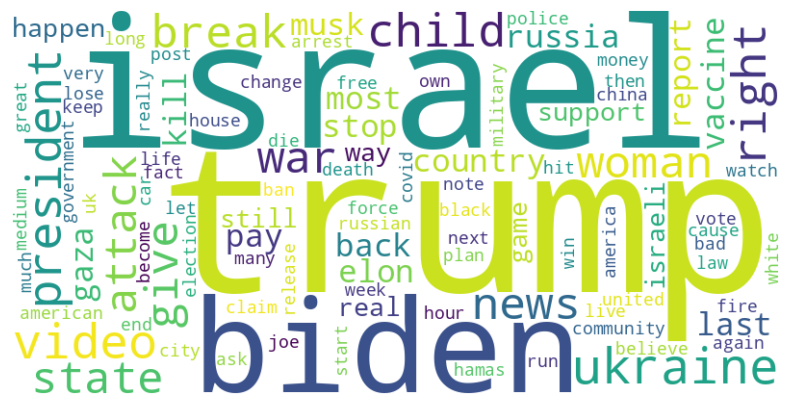

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

def count_words(lst_text : list, stop_words : list = []) -> pd.DataFrame:
  vectorizer = CountVectorizer(stop_words=stop_words)

  # Transformation des textes en matrice de compte
  X = vectorizer.fit_transform(lst_text)

  # Extraction des mots et de leurs fréquences
  word_freq = pd.DataFrame({
      'word': vectorizer.get_feature_names_out(),
      'frequency': X.toarray().sum(axis=0)
  })

  # Tri par fréquence décroissante
  word_freq = word_freq.sort_values(by='frequency', ascending=False)
  return word_freq

def generate_wordcloud(df, word_col, freq_col, show=True):
    word_freq_dict = dict(zip(df[word_col], df[freq_col]))
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

    if show:
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.show()

# on filtre certains termes / erreurs du modèle qui auraient pu faire partie d'une procédure de nettoyage en amont
stop_words = ['https','pic','twitter','com','@', 'have', 'just', 'people', 'year', 'now', 'say', 'get', 'go', 'do', 'new', 'make', 'more', 'so', 'see', 'breaking','time', 'know', 'take', 'use', 'day', 'first', 'man', 'world', 'today', 'us', 'come', 'only', 'want', 'look', 'never', 'good', 'be', 'away', 'find', 'old', 'try', 'name', 'one', 'even', 'work', 'other', 'call', 'show', 'tell', 'need', 'high', 'here', 'here', 'put', 'play', 'big', 'thing', 'well', 'month', 'same', 'think', 'also', 'ever', 'leave', 'send']

# on affiche les termes les plus fréquents
word_frequencies = count_words(df['lemmatized_text'].to_list(), stop_words)
display(word_frequencies.head())
generate_wordcloud(word_frequencies.head(100), "word", "frequency", show = True)

# Sampling

On peut entrainer notre modèle sur l'ensemble des données. Néanmoins, le plus souvent, on dispose d'un dataset volumineux. Dès lors, on défini une méthode d'échantillonage. On entraine le modèle sur cet échantillon, puis on execute l'inférence sur le reste du dataset.

Si on dispose d'un GPU, on peut utiliser Rapids qui intègre une implémentation de pandas / sklearn pour réaliser les traitements plus rapidement et/ou sur de plus gros volumes de données.

In [ ]:
df['text']

,text
0,"Buyers of competing electric cars receive a $7500 tax credit, but Tesla does not"
1,Reagan was so right. Are you paying attention? pic.twitter.com/oBTsNDaIin
2,thank u for the money @elonmusk pic.twitter.com/RMsLiFOThr
3,Enjoy the one in century. Solar eclipse at Niagara Falls pic.twitter.com/xFsb9atEJj
4,"Is ANYONE asking how Ron DeSantis was worth $340,000 in 2020 and is now worth $52 million?"
...,...
38700,"In Birmingham, migrant crowds are waving swords on live TV, where are the British police at the moment? pic.twitter.com/t1Neyzdae8"
38701,BREAKING: United Kingdom Just Banned Donald Trump from fleeing to Great Britain to escape prosecution in the United States. pic.twitter.com/GZhCyNMyMv
38702,"In the Russian dance Berezka, women move with short steps, so short that they look like they're floating. pic.twitter.com/rulqcsHnWl"
38703,Nothing to see here…the closing ceremony of the Olympics has a headless angel with no arms. pic.twitter.com/7SjwTSSsI9


Permet de faire les échantillons

In [ ]:
df_sample = df.sample(10000)
df_sample.shape

(10000, 31)

In [ ]:
df_not_sample =  df[~df['tweetId'].isin(df_sample['tweetId'])]
df_not_sample.shape

(26060, 31)

# Topic Modeling - Vectorisation

In [ ]:
from sentence_transformers import SentenceTransformer

# on charge notre modèle
model = SentenceTransformer("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")

# on encode nos textes
sample_embeddings = model.encode(list(df_sample['text']))
not_sample_embeddings = model.encode(list(df_not_sample['text']))

# Taille de nos vecteurs : nb de textes x nb de dimensions du vecteur
sample_embeddings.shape

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/4.12k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/645 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/471M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/480 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.08M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

(10000, 384)

# Topic Modeling - Réduction de dimension


In [ ]:
import umap
import plotly.express as px

parameters = {"n_neighbors" : 10,
              "n_components" : 2,
              "min_dist" : 0.1,
              "metric" : "cosine",
              "spread" : 0.8,
              "random_state" : 42,
              "n_epochs" : 1000,
              "learning_rate" : 0.01
              }


reducer = umap.UMAP(**parameters).fit(sample_embeddings)

#on récupère les vecteurs réduits
sample_reduced_embeddings = reducer.transform(sample_embeddings)

# Taille de notre vecteur réduit
sample_reduced_embeddings.shape

# on ajoute les coordonnées réduites du vecteur dans notre dataframe
df_sample['x'] = sample_reduced_embeddings[:,0]
df_sample['y'] = sample_reduced_embeddings[:,1]

# on affiche nos résultats
fig = px.scatter(
    df_sample,
    x="x",
    y="y",
    width = 1000,
    height = 1000
)
fig.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
not_sample_reduced_embeddings = reducer.transform(not_sample_embeddings)

df_not_sample['x'] = not_sample_reduced_embeddings[:,0]
df_not_sample['y'] = not_sample_reduced_embeddings[:,1]

df_concat = pd.concat([df_sample, df_not_sample])

# on affiche nos résultats
fig = px.scatter(
    df_concat,
    x="x",
    y="y",
    width = 1000,
    height = 1000
)
fig.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

<ipython-input-16-c63c0a7e3d49>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-16-c63c0a7e3d49>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Topic Modeling - Supervision


In [ ]:
df_sample[['text', 'labels']]

KeyError: "['labels'] not in index"

# Topic Modeling - Clusturing



In [ ]:
import hdbscan

### HDBSCAN PARAMETERS
clustering_params = {
    "min_cluster_size": 5,
    "min_samples" : 3,
    "cluster_selection_method" : 'eom',
    "prediction_data" : True                    ## ATTENTION CE PARAMETRE EST TRES IMPORTANT SI ON SOUHAITE EFFECTUER LE CLUSTERING D'ABORD SUR LE SAMPLE, PUIS PREDIRE DE NOUVEAUX POINTS
    }

clusterer = hdbscan.HDBSCAN(**clustering_params)
clusterer.fit(sample_reduced_embeddings)


df_sample['topic'] = clusterer.labels_.astype(str)
df_sample['topic_proba'] = clusterer.probabilities_

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [ ]:
df_sample['topic'].nunique()

568

In [ ]:
new_labels, new_proba = hdbscan.approximate_predict(clusterer, not_sample_reduced_embeddings)

df_not_sample['topic'] = new_labels.astype(str)
df_not_sample['topic_proba'] = new_proba

df_concat = pd.concat([df_sample, df_not_sample])

<ipython-input-22-9cb429c7cfad>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-22-9cb429c7cfad>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Topic Modeling - Représentation

In [ ]:
import plotly.express as px
import textwrap

def wrap_text(text, width=50):
    return "<br>".join(textwrap.wrap(text, width))

df_concat['text_to_display'] = df_concat['text'].apply(wrap_text)

fig_clusters = px.scatter(
    df_concat,
    x="x_supervised",
    y="y_supervised",
    color="topic",
    width = 1000,
    height = 1000,
    hover_data = ['text_to_display']

)

# Show the plot
fig_clusters.show()

ValueError: Plotly Express cannot process wide-form data with columns of different type.

## Etude sur la désinformation


In [6]:
import pandas as pd  # Ensure pandas is imported

# Load dataset
df = pd.read_csv("/content/dataset_only_english.csv")  # Adjust the filename

# Set display options
pd.set_option("display.max_colwidth", None)  # No truncation of text columns
pd.set_option("display.width", 200)  # Wider display for better readability

# Define the misleading types with their corresponding category names
misleading_types = [
    ("misleadingFactualError", "Factual Error"),
    ("misleadingManipulatedMedia", "Manipulated Media"),
    ("misleadingOutdatedInformation", "Outdated Information"),
    ("misleadingMissingImportantContext", "Missing Important Context"),
    ("misleadingUnverifiedClaimAsFact", "Unverified Claims"),
    ("misleadingSatire", "Satire")
]

# Define the columns to display
columns_to_display = ['tweetId', 'classification', 'text', 'summary']

# Loop through each misleading type and filter the dataframe
for misleading_type, category_name in misleading_types:
    # Filter the dataframe for each misleading category
    df_filtered = df[df[misleading_type] > 0]

    # Display the category name and the count of flagged tweets
    print(f"\n=== {category_name}: {len(df_filtered)} tweets flagged ===\n")

    # Display the filtered rows with the desired columns
    print(df_filtered[columns_to_display].to_string(index=False))

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
1659028049395077120 MISINFORMED_OR_POTENTIALLY_MISLEADING                                                                             Measles - one week of a rash, and then lifelong immunity.MMR vaccine - potential for lifelong autism and hundreds of other injuries including death, requires boosters, and no lifelong immunity because being vaccinated doesn't mean immunity. pic.twitter.com/VfuMv7c4y6— Larry Cook (@stopvaccinating) May 18, 2023\n                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

In [9]:
import pandas as pd  # Ensure pandas is imported

# Load dataset
df = pd.read_csv("/content/dataset_only_english.csv")  # Adjust the filename

# Set display options
pd.set_option("display.max_colwidth", None)  # No truncation of text columns
pd.set_option("display.width", 200)  # Wider display for better readability

# Count tweets classified as MISINFORMED_OR_POTENTIALLY_MISLEADING
misinfo_count = (df['classification'] == "MISINFORMED_OR_POTENTIALLY_MISLEADING").sum()

print(f"Number of tweets classified as MISINFORMED_OR_POTENTIALLY_MISLEADING: {misinfo_count}")


Number of tweets classified as MISINFORMED_OR_POTENTIALLY_MISLEADING: 38703


In [10]:
import pandas as pd  # Ensure pandas is imported

# Load dataset
df = pd.read_csv("/content/dataset_only_english.csv")  # Adjust the filename

# Set display options
pd.set_option("display.max_colwidth", None)  # No truncation of text columns
pd.set_option("display.width", 200)  # Wider display for better readability

# Count tweets classified as NOT*MISLEADING
misinfo_count = (df['classification'] == "NOT*MISLEADING").sum()

print(f"Number of tweets classified as NOT*MISLEADING: {misinfo_count}")


Number of tweets classified as NOT*MISLEADING: 0


In [12]:
import pandas as pd  # Ensure pandas is imported

# Load dataset
df = pd.read_csv("/content/dataset_only_english.csv")  # Adjust the filename

# Count tweets where notMisleadingFactuallyCorrect is 1
not_misleading_count = (df['notMisleadingFactuallyCorrect'] == 1).sum()

print(f"Number of tweets labeled as notMisleadingFactuallyCorrect: {not_misleading_count}")
# Filter tweets where notMisleadingFactuallyCorrect is 1
df_not_misleading = df[df['notMisleadingFactuallyCorrect'] == 1]

# Display the result
print(df_not_misleading.to_string(index=False))  # Ensures full visibility of the row


Number of tweets labeled as notMisleadingFactuallyCorrect: 1
             noteId                                          noteAuthorParticipantId  createdAtMillis             tweetId classification  misleadingOther  misleadingFactualError  misleadingManipulatedMedia  misleadingOutdatedInformation  misleadingMissingImportantContext  misleadingUnverifiedClaimAsFact  misleadingSatire  notMisleadingOther  notMisleadingFactuallyCorrect  notMisleadingOutdatedButNotWhenWritten  notMisleadingClearlySatire  notMisleadingPersonalOpinion  trustworthySources                                                                                                                                                                                                                                                                                                                                                                                                                          summary  isMediaNote                  